In [924]:
"""
Exercise description
--------------------

In the context of Mercadolibre's Marketplace an algorithm is needed to
predict if an item listed in the markeplace is new or used.

Your task to design a machine learning model to predict if an item is new or
used and then evaluate the model over held-out test data.

To assist in that task a dataset is provided in `MLA_100k.jsonlines` and a
function to read that dataset in `build_dataset`.

For the evaluation you will have to choose an appropiate metric and also
elaborate an argument on why that metric was chosen.

The deliverables are:
    - This file including all the code needed to define and evaluate a model.
    - A text file with a short explanation on the criteria applied to choose
      the metric and the performance achieved on that metric.


"""

import json


# You can safely assume that `build_dataset` is correctly implemented
def build_dataset():
    data = [json.loads(x) for x in open("MLA_100k.jsonlines")]
    target = lambda x: x.get("condition")
    N = -10000
    X_train = data[:N]
    X_test = data[N:]
    y_train = [target(x) for x in X_train]
    y_test = [target(x) for x in X_test]
    for x in X_test:
        del x["condition"]
    # I will delete condition for X_train too
    # alexis code
    for x in X_train:
        del x["condition"]
    # alexis code
    return X_train, y_train, X_test, y_test


if __name__ == "__main__":
    print("Loading dataset...")
    # Train and test data following sklearn naming conventions
    # X_train (X_test too) is a list of dicts with information about each item.
    # y_train (y_test too) contains the labels to be predicted (new or used).
    # The label of X_train[i] is y_train[i].
    # The label of X_test[i] is y_test[i].
    X_train, y_train, X_test, y_test = build_dataset()

    # Insert your code below this line:
    # ...


Loading dataset...


In [925]:
%matplotlib inline
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (8, 8)
plt.style.use('ggplot')
pd.set_option('display.float_format', lambda x: '%.5f' % x)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
from sklearn.model_selection import train_test_split #change cross_validation for model_selection https://stackoverflow.com/questions/30667525/importerror-no-module-named-sklearn-cross-validation
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
import pickle
from sklearn.model_selection import cross_val_score
import statsmodels.api as sm

In [926]:
###
#code I already had to plot categrical variables
###
def plot_freq_categorical(serie, titulo_grafica, y_label, orden = False):
    if not orden:
        orden = serie.value_counts().index
    df = pd.DataFrame(serie)
    df.columns=[y_label]
    ax = sns.countplot(y = y_label, data = df, order = orden)
    plt.title(titulo_grafica)
    plt.xlabel('Cantidad')
    
    total = len(df[y_label])
    for p in ax.patches:
        percentage = '{:.2f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))
    plt.show()

In [927]:
### 
#This code if from google, I tipically use it as a quick way to calculate IV
###

max_bin = 20
force_bin = 3
# define a binning function
def mono_bin(Y, X, n = max_bin):
   
    df1 = pd.DataFrame({"X": X, "Y": Y})
    justmiss = df1[['X','Y']][df1.X.isnull()]
    notmiss = df1[['X','Y']][df1.X.notnull()]
    r = 0
    while np.abs(r) < 1:
        print(r)
        try:
            d1 = pd.DataFrame({"X": notmiss.X, "Y": notmiss.Y, "Bucket": pd.qcut(notmiss.X, n)})
            d2 = d1.groupby('Bucket', as_index=True)
            r, p = stats.spearmanr(d2.mean().X, d2.mean().Y)
            n = n - 1
        except Exception as e:
            n = n - 1
    if len(d2) == 1:
        n = force_bin        
        bins = algos.quantile(notmiss.X, np.linspace(0, 1, n))
        if len(np.unique(bins)) == 2:
            bins = np.insert(bins, 0, 1)
            bins[1] = bins[1]-(bins[1]/2)
        d1 = pd.DataFrame({"X": notmiss.X, "Y": notmiss.Y, "Bucket": pd.cut(notmiss.X, np.unique(bins),include_lowest=True)})
        d2 = d1.groupby('Bucket', as_index=True)
   
    d3 = pd.DataFrame({},index=[])
    d3["MIN_VALUE"] = d2.min().X
    d3["MAX_VALUE"] = d2.max().X
    d3["COUNT"] = d2.count().Y
    d3["EVENT"] = d2.sum().Y
    d3["NONEVENT"] = d2.count().Y - d2.sum().Y
    d3=d3.reset_index(drop=True)
   
    if len(justmiss.index) > 0:
        d4 = pd.DataFrame({'MIN_VALUE':np.nan},index=[0])
        d4["MAX_VALUE"] = np.nan
        d4["COUNT"] = justmiss.count().Y
        d4["EVENT"] = justmiss.sum().Y
        d4["NONEVENT"] = justmiss.count().Y - justmiss.sum().Y
        d3 = d3.append(d4,ignore_index=True)
   
    d3["EVENT_RATE"] = d3.EVENT/d3.COUNT
    d3["NON_EVENT_RATE"] = d3.NONEVENT/d3.COUNT
    d3["DIST_EVENT"] = d3.EVENT/d3.sum().EVENT
    d3["DIST_NON_EVENT"] = d3.NONEVENT/d3.sum().NONEVENT
    d3["WOE"] = np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["IV"] = (d3.DIST_EVENT-d3.DIST_NON_EVENT)*np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["VAR_NAME"] = "VAR"
    d3 = d3[['VAR_NAME','MIN_VALUE', 'MAX_VALUE', 'COUNT', 'EVENT', 'EVENT_RATE', 'NONEVENT', 'NON_EVENT_RATE', 'DIST_EVENT','DIST_NON_EVENT','WOE', 'IV']]      
    d3 = d3.replace([np.inf, -np.inf], 0)
    d3.IV = d3.IV.sum()
   
    return(d3)
def char_bin(Y, X):
       
    df1 = pd.DataFrame({"X": X, "Y": Y})
    justmiss = df1[['X','Y']][df1.X.isnull()]
    notmiss = df1[['X','Y']][df1.X.notnull()]    
    df2 = notmiss.groupby('X',as_index=True)
   
    d3 = pd.DataFrame({},index=[])
    d3["COUNT"] = df2.count().Y
    d3["MIN_VALUE"] = df2.sum().Y.index
    d3["MAX_VALUE"] = d3["MIN_VALUE"]
    d3["EVENT"] = df2.sum().Y
    d3["NONEVENT"] = df2.count().Y - df2.sum().Y
   
    if len(justmiss.index) > 0:
        d4 = pd.DataFrame({'MIN_VALUE':np.nan},index=[0])
        d4["MAX_VALUE"] = np.nan
        d4["COUNT"] = justmiss.count().Y
        d4["EVENT"] = justmiss.sum().Y
        d4["NONEVENT"] = justmiss.count().Y - justmiss.sum().Y
        d3 = d3.append(d4,ignore_index=True)
   
    d3["EVENT_RATE"] = d3.EVENT/d3.COUNT
    d3["NON_EVENT_RATE"] = d3.NONEVENT/d3.COUNT
    d3["DIST_EVENT"] = d3.EVENT/d3.sum().EVENT
    d3["DIST_NON_EVENT"] = d3.NONEVENT/d3.sum().NONEVENT
    d3["WOE"] = np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["IV"] = (d3.DIST_EVENT-d3.DIST_NON_EVENT)*np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["VAR_NAME"] = "VAR"
    d3 = d3[['VAR_NAME','MIN_VALUE', 'MAX_VALUE', 'COUNT', 'EVENT', 'EVENT_RATE', 'NONEVENT', 'NON_EVENT_RATE', 'DIST_EVENT','DIST_NON_EVENT','WOE', 'IV']]      
    d3 = d3.replace([np.inf, -np.inf], 0)
    d3.IV = d3.IV.sum()
    d3 = d3.reset_index(drop=True)
   
    return(d3)
def data_vars(df1, target):
   
    stack = traceback.extract_stack()
    filename, lineno, function_name, code = stack[-2]
    vars_name = re.compile(r'\((.*?)\).*$').search(code).groups()[0]
    final = (re.findall(r"[\w']+", vars_name))[-1]
   
    x = df1.dtypes.index
    count = -1
    
    for i in x:
        print(i)
        if i.upper() not in (final.upper()):
            if np.issubdtype(df1[i], np.number) and len(Series.unique(df1[i])) > 2:
                conv = mono_bin(target, df1[i])
                print("mono")
                conv["VAR_NAME"] = i
                count = count + 1
            else:
                print("char")
                conv = char_bin(target, df1[i])
                conv["VAR_NAME"] = i            
                count = count + 1
               
            if count == 0:
                print(0)
                iv_df = conv
            else:
                print("append")
                iv_df = iv_df.append(conv,ignore_index=True)
   
    iv = pd.DataFrame({'IV':iv_df.groupby('VAR_NAME').IV.max()})
    iv = iv.reset_index()
    return(iv_df,iv)

In [928]:
X_train

[{'seller_address': {'comment': '',
   'longitude': -58.3986709,
   'id': 78162842,
   'country': {'name': 'Argentina', 'id': 'AR'},
   'address_line': '',
   'latitude': -34.6280698,
   'search_location': {'neighborhood': {'name': 'San Cristóbal',
     'id': 'TUxBQlNBTjkwNTZa'},
    'state': {'name': 'Capital Federal', 'id': 'TUxBUENBUGw3M2E1'},
    'city': {'name': 'Capital Federal', 'id': 'TUxBQ0NBUGZlZG1sYQ'}},
   'zip_code': '',
   'city': {'name': 'San Cristóbal', 'id': 'TUxBQlNBTjkwNTZa'},
   'state': {'name': 'Capital Federal', 'id': 'AR-C'}},
  'warranty': None,
  'sub_status': [],
  'seller_contact': None,
  'deal_ids': [],
  'base_price': 80,
  'shipping': {'local_pick_up': True,
   'methods': [],
   'tags': [],
   'free_shipping': False,
   'mode': 'not_specified',
   'dimensions': None},
  'non_mercado_pago_payment_methods': [{'description': 'Transferencia bancaria',
    'id': 'MLATB',
    'type': 'G'},
   {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 

In [929]:
len(X_train)

90000

In [930]:
len(X_train[0])

47

In [931]:
X_train[0]

{'seller_address': {'comment': '',
  'longitude': -58.3986709,
  'id': 78162842,
  'country': {'name': 'Argentina', 'id': 'AR'},
  'address_line': '',
  'latitude': -34.6280698,
  'search_location': {'neighborhood': {'name': 'San Cristóbal',
    'id': 'TUxBQlNBTjkwNTZa'},
   'state': {'name': 'Capital Federal', 'id': 'TUxBUENBUGw3M2E1'},
   'city': {'name': 'Capital Federal', 'id': 'TUxBQ0NBUGZlZG1sYQ'}},
  'zip_code': '',
  'city': {'name': 'San Cristóbal', 'id': 'TUxBQlNBTjkwNTZa'},
  'state': {'name': 'Capital Federal', 'id': 'AR-C'}},
 'warranty': None,
 'sub_status': [],
 'seller_contact': None,
 'deal_ids': [],
 'base_price': 80,
 'shipping': {'local_pick_up': True,
  'methods': [],
  'tags': [],
  'free_shipping': False,
  'mode': 'not_specified',
  'dimensions': None},
 'non_mercado_pago_payment_methods': [{'description': 'Transferencia bancaria',
   'id': 'MLATB',
   'type': 'G'},
  {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'},
  {'description': 'Efe

In [932]:
X_train[0].keys()

dict_keys(['seller_address', 'warranty', 'sub_status', 'seller_contact', 'deal_ids', 'base_price', 'shipping', 'non_mercado_pago_payment_methods', 'seller_id', 'variations', 'location', 'site_id', 'listing_type_id', 'price', 'attributes', 'buying_mode', 'tags', 'listing_source', 'parent_item_id', 'coverage_areas', 'category_id', 'descriptions', 'last_updated', 'international_delivery_mode', 'pictures', 'id', 'official_store_id', 'differential_pricing', 'accepts_mercadopago', 'original_price', 'currency_id', 'thumbnail', 'title', 'automatic_relist', 'date_created', 'secure_thumbnail', 'stop_time', 'status', 'video_id', 'catalog_product_id', 'subtitle', 'initial_quantity', 'start_time', 'permalink', 'geolocation', 'sold_quantity', 'available_quantity'])

In [933]:
X_train[0].values()

dict_values([{'comment': '', 'longitude': -58.3986709, 'id': 78162842, 'country': {'name': 'Argentina', 'id': 'AR'}, 'address_line': '', 'latitude': -34.6280698, 'search_location': {'neighborhood': {'name': 'San Cristóbal', 'id': 'TUxBQlNBTjkwNTZa'}, 'state': {'name': 'Capital Federal', 'id': 'TUxBUENBUGw3M2E1'}, 'city': {'name': 'Capital Federal', 'id': 'TUxBQ0NBUGZlZG1sYQ'}}, 'zip_code': '', 'city': {'name': 'San Cristóbal', 'id': 'TUxBQlNBTjkwNTZa'}, 'state': {'name': 'Capital Federal', 'id': 'AR-C'}}, None, [], None, [], 80, {'local_pick_up': True, 'methods': [], 'tags': [], 'free_shipping': False, 'mode': 'not_specified', 'dimensions': None}, [{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}, {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}], 74952096, [], {}, 'MLA', 'bronze', 80, [], 'buy_it_now', ['dragged_bids_and_visits'], '', 'MLA568261029', [], 'MLA126406', [{'id': 'MLA578052

In [934]:
y_train

['new',
 'used',
 'used',
 'new',
 'used',
 'new',
 'used',
 'used',
 'new',
 'new',
 'new',
 'new',
 'used',
 'new',
 'new',
 'new',
 'used',
 'used',
 'new',
 'new',
 'used',
 'new',
 'new',
 'used',
 'new',
 'used',
 'used',
 'used',
 'used',
 'new',
 'used',
 'new',
 'new',
 'new',
 'new',
 'used',
 'new',
 'used',
 'used',
 'used',
 'used',
 'used',
 'new',
 'new',
 'used',
 'used',
 'used',
 'new',
 'new',
 'used',
 'used',
 'new',
 'used',
 'new',
 'used',
 'new',
 'new',
 'used',
 'new',
 'new',
 'used',
 'new',
 'new',
 'used',
 'used',
 'new',
 'used',
 'used',
 'new',
 'new',
 'new',
 'new',
 'new',
 'used',
 'new',
 'used',
 'used',
 'used',
 'used',
 'new',
 'new',
 'used',
 'used',
 'used',
 'used',
 'new',
 'new',
 'used',
 'new',
 'new',
 'new',
 'used',
 'new',
 'used',
 'new',
 'new',
 'new',
 'new',
 'used',
 'used',
 'new',
 'new',
 'new',
 'used',
 'new',
 'used',
 'new',
 'new',
 'new',
 'new',
 'new',
 'new',
 'used',
 'new',
 'new',
 'new',
 'new',
 'used',
 'us

In [935]:
test_case = {'seller_address': {'comment': '',
  'longitude': -58.3986709,
  'id': 78162842,
  'country': {'name': 'Argentina', 'id': 'AR'},
  'address_line': '',
  'latitude': -34.6280698,
  'search_location': {'neighborhood': {'name': 'San Cristóbal',
    'id': 'TUxBQlNBTjkwNTZa'},
   'state': {'name': 'Capital Federal', 'id': 'TUxBUENBUGw3M2E1'},
   'city': {'name': 'Capital Federal', 'id': 'TUxBQ0NBUGZlZG1sYQ'}},
  'zip_code': '',
  'city': {'name': 'San Cristóbal', 'id': 'TUxBQlNBTjkwNTZa'},
  'state': {'name': 'Capital Federal', 'id': 'AR-C'}},
 'warranty': None,
 'sub_status': [],
 'condition': 'new',
 'seller_contact': None,
 'deal_ids': [],
 'base_price': 80,
 'shipping': {'local_pick_up': True,
  'methods': [],
  'tags': [],
  'free_shipping': False,
  'mode': 'not_specified',
  'dimensions': None},
 'non_mercado_pago_payment_methods': [{'description': 'Transferencia bancaria',
   'id': 'MLATB',
   'type': 'G'},
  {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'},
  {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}],
 'seller_id': 74952096,
 'variations': [],
 'location': {},
 'site_id': 'MLA',
 'listing_type_id': 'bronze',
 'price': 80,
 'attributes': [],
 'buying_mode': 'buy_it_now',
 'tags': ['dragged_bids_and_visits'],
 'listing_source': '',
 'parent_item_id': 'MLA568261029',
 'coverage_areas': [],
 'category_id': 'MLA126406',
 'descriptions': [{'id': 'MLA578052519-912855983'}],
 'last_updated': '2015-09-05T20:42:58.000Z',
 'international_delivery_mode': 'none',
 'pictures': [{'size': '500x375',
   'secure_url': 'https://a248.e.akamai.net/mla-s1-p.mlstatic.com/5386-MLA4352067878_052013-O.jpg',
   'max_size': '1200x900',
   'url': 'http://mla-s1-p.mlstatic.com/5386-MLA4352067878_052013-O.jpg',
   'quality': '',
   'id': '5386-MLA4352067878_052013'},
  {'size': '500x375',
   'secure_url': 'https://a248.e.akamai.net/mla-s1-p.mlstatic.com/5361-MLA4352068035_052013-O.jpg',
   'max_size': '1200x900',
   'url': 'http://mla-s1-p.mlstatic.com/5361-MLA4352068035_052013-O.jpg',
   'quality': '',
   'id': '5361-MLA4352068035_052013'}],
 'id': 'MLA578052519',
 'official_store_id': None,
 'differential_pricing': None,
 'accepts_mercadopago': True,
 'original_price': None,
 'currency_id': 'ARS',
 'thumbnail': 'http://mla-s1-p.mlstatic.com/5386-MLA4352067878_052013-I.jpg',
 'title': 'Auriculares Samsung Originales Manos Libres Cable Usb Oferta',
 'automatic_relist': False,
 'date_created': '2015-09-05T20:42:53.000Z',
 'secure_thumbnail': 'https://a248.e.akamai.net/mla-s1-p.mlstatic.com/5386-MLA4352067878_052013-I.jpg',
 'stop_time': '2015-11-04T20:42:53.000Z',
 'status': 'active',
 'video_id': None,
 'catalog_product_id': None,
 'subtitle': None,
 'initial_quantity': 1,
 'start_time': '2015-09-05T20:42:53.000Z',
 'permalink': 'http://articulo.mercadolibre.com.ar/MLA-578052519-auriculares-samsung-originales-manos-libres-cable-usb-oferta-_JM',
 'geolocation': {'latitude': -34.6280698, 'longitude': -58.3986709},
 'sold_quantity': 0,
 'available_quantity': 1}

### To begin with, from the sellers address the only things that might be interesting for the model are the country, state and city. Maybe some of this characteristics make item more probable to be used instead of new.

In [936]:
def add_country_state_and_city_and_delete_dict_location(json_dict):
    dict_location = json_dict['seller_address']
    json_dict['country'] = dict_location['country']['id'] # i keep the id because it is shorter and does not affect uniqueness
    json_dict['state'] = dict_location['state']['name']# i keep the name because id is not easily understandable
    json_dict['city'] = dict_location['city']['name'] # i keep the name because id is not easily understandable
    # should ask the difference between search_location and the other location
    del json_dict['seller_address']
    return json_dict

add_country_state_and_city_and_delete_dict_location(test_case)

{'warranty': None,
 'sub_status': [],
 'condition': 'new',
 'seller_contact': None,
 'deal_ids': [],
 'base_price': 80,
 'shipping': {'local_pick_up': True,
  'methods': [],
  'tags': [],
  'free_shipping': False,
  'mode': 'not_specified',
  'dimensions': None},
 'non_mercado_pago_payment_methods': [{'description': 'Transferencia bancaria',
   'id': 'MLATB',
   'type': 'G'},
  {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'},
  {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}],
 'seller_id': 74952096,
 'variations': [],
 'location': {},
 'site_id': 'MLA',
 'listing_type_id': 'bronze',
 'price': 80,
 'attributes': [],
 'buying_mode': 'buy_it_now',
 'tags': ['dragged_bids_and_visits'],
 'listing_source': '',
 'parent_item_id': 'MLA568261029',
 'coverage_areas': [],
 'category_id': 'MLA126406',
 'descriptions': [{'id': 'MLA578052519-912855983'}],
 'last_updated': '2015-09-05T20:42:58.000Z',
 'international_delivery_mode': 'none',
 'pictures': [{'size': '500x

In [937]:
for elem in X_train:
    add_country_state_and_city_and_delete_dict_location(elem)

### As I do not have the images to make a machine vision model, I will track the amount of photos posted

In [938]:
X_train[0]['pictures']

[{'size': '500x375',
  'secure_url': 'https://a248.e.akamai.net/mla-s1-p.mlstatic.com/5386-MLA4352067878_052013-O.jpg',
  'max_size': '1200x900',
  'url': 'http://mla-s1-p.mlstatic.com/5386-MLA4352067878_052013-O.jpg',
  'quality': '',
  'id': '5386-MLA4352067878_052013'},
 {'size': '500x375',
  'secure_url': 'https://a248.e.akamai.net/mla-s1-p.mlstatic.com/5361-MLA4352068035_052013-O.jpg',
  'max_size': '1200x900',
  'url': 'http://mla-s1-p.mlstatic.com/5361-MLA4352068035_052013-O.jpg',
  'quality': '',
  'id': '5361-MLA4352068035_052013'}]

In [939]:
def add_amount_of_pictures_and_del_pictures(json_dict):
    dict_pictures = json_dict['pictures']
    json_dict['amount_of_pictures'] = len(dict_pictures)
    del json_dict['pictures']
    return json_dict

add_amount_of_pictures_and_del_pictures(test_case)
    

{'warranty': None,
 'sub_status': [],
 'condition': 'new',
 'seller_contact': None,
 'deal_ids': [],
 'base_price': 80,
 'shipping': {'local_pick_up': True,
  'methods': [],
  'tags': [],
  'free_shipping': False,
  'mode': 'not_specified',
  'dimensions': None},
 'non_mercado_pago_payment_methods': [{'description': 'Transferencia bancaria',
   'id': 'MLATB',
   'type': 'G'},
  {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'},
  {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}],
 'seller_id': 74952096,
 'variations': [],
 'location': {},
 'site_id': 'MLA',
 'listing_type_id': 'bronze',
 'price': 80,
 'attributes': [],
 'buying_mode': 'buy_it_now',
 'tags': ['dragged_bids_and_visits'],
 'listing_source': '',
 'parent_item_id': 'MLA568261029',
 'coverage_areas': [],
 'category_id': 'MLA126406',
 'descriptions': [{'id': 'MLA578052519-912855983'}],
 'last_updated': '2015-09-05T20:42:58.000Z',
 'international_delivery_mode': 'none',
 'id': 'MLA578052519',
 'off

In [940]:
for elem in X_train:
    add_amount_of_pictures_and_del_pictures(elem)

In [941]:
X_train[1]

{'warranty': 'NUESTRA REPUTACION',
 'sub_status': [],
 'seller_contact': None,
 'deal_ids': [],
 'base_price': 2650,
 'shipping': {'local_pick_up': True,
  'methods': [],
  'tags': [],
  'free_shipping': False,
  'mode': 'me2',
  'dimensions': None},
 'non_mercado_pago_payment_methods': [{'description': 'Transferencia bancaria',
   'id': 'MLATB',
   'type': 'G'},
  {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}],
 'seller_id': 42093335,
 'variations': [],
 'location': {},
 'site_id': 'MLA',
 'listing_type_id': 'silver',
 'price': 2650,
 'attributes': [],
 'buying_mode': 'buy_it_now',
 'tags': [],
 'listing_source': '',
 'parent_item_id': 'MLA561574487',
 'coverage_areas': [],
 'category_id': 'MLA10267',
 'descriptions': [{'id': 'MLA581565358-930764806'}],
 'last_updated': '2015-09-26T18:08:34.000Z',
 'international_delivery_mode': 'none',
 'id': 'MLA581565358',
 'official_store_id': None,
 'differential_pricing': None,
 'accepts_mercadopago': True,
 'original_price': None,
 'c

### Lets check if the title has some sort of indicative word or phrase like "new" o "used".

### I will check the two words before "nuevo" separately and together to see if the is a pattern that will negate the effect of "nuevo". Example: "como nuevo".

In [942]:
def normalize_text(text):
    text = text.lower()
    text = text.replace("á", "a")
    text = text.replace("é", "e")
    text = text.replace("í", "i")
    text = text.replace("ó", "o")
    text = text.replace("ú", "u")
    text = text.replace("ñ", "ni")
    text = re.sub("[^0-9a-z_\s]+", "", text)#delete everything thats not numbers,letters or spaces 
    text = re.sub(' +', ' ', text)#turn multiple spaces into one
    return text

def print_freq_in_list_over_4_appeances(list_to_freq):
    word_or_phrase_freq = {} 
    for item in list_to_freq: 
        if item in word_or_phrase_freq: 
            word_or_phrase_freq[item] += 1
        else: 
            word_or_phrase_freq[item] = 1
    for w in sorted(word_or_phrase_freq, key=word_or_phrase_freq.get, reverse=True):
        if word_or_phrase_freq[w] > 4:
            print(w, word_or_phrase_freq[w])
            
def check_words_before_searchword(searchword):
    words_before_searchword = []
    for elem in X_train:
        publication_title = elem['title']
        publication_title = normalize_text(publication_title)
        if searchword in publication_title:
            words = publication_title.split(" ")
            #print(publication_title)
            #print(words)
            if words.index(searchword) if searchword in words else False: #can be nuevo o nuevos with multiples s
                index = words.index(searchword)
                words_before_searchword.append(words[index - 1])
                words_before_searchword.append(words[index - 2])
                words_before_searchword.append(words[index - 2]  + " " + words[index - 1])
            elif words.index(searchword + "s") if searchword + "s" in words else False:
                index = words.index(searchword + "s")
                words_before_searchword.append(words[index - 1])
                words_before_searchword.append(words[index - 2])
                words_before_searchword.append(words[index - 2]  + words[index - 1])
    print_freq_in_list_over_4_appeances(words_before_searchword)
            
check_words_before_searchword("nuevo")

cd 264
como 184
de 88
original 81
dvd 77
a 63
2 58
y 46
vinilo 40
importado 35
el 34
3 29
libro 29
del 28
varios 22
ps3 21
la 21
lp 21
m 19
los 17
en 17
casi 17
para 16
16gb 15
modelo 15
l 15
5 14
6 14
g 14
talle 13
usa 13
c 13
igual 13
d 13
4 13
r 12
fiat 12
igual a 12
sellos 11
p 11
argentina 11
e 11
4g 11
1 11
j 11
fisico 10
s 10
caja 10
cassette 10
of 10
lp vinilo 10
100 10
blanco 9
int 9
varios int 9
liberado 9
12 9
libre 9
anio 9
ps4 8
f 8
x 8
al 8
usado 8
cartone 8
doble 8
cd importado 8
gb 8
estado 8
32gb 8
cuero 8
cd como 8
dura 7
ej 7
oferta 7
mujer 7
editorial 7
jean 7
gold 7
workbook 7
disney 7
2 cd 7
metalico 7
importado cd 7
core 7
simple 7
temporada 7
original como 7
falcon 7
book 7
ford 7
cd dvd 7
mar 6
h 6
metal 6
ps3 original 6
fabrica 6
peluche 6
alfaguara 6
the 6
originales 6
disco 6
las 6
sol 6
hombre 6
usado como 6
lte 6
con 6
b 6
t 6
da 6
azul 6
fiesta 6
x 2 6
cds 6
importado como 5
juego 5
generacion 5
hits 5
mini 5
ejemplar 5
coleccion 5
trasero 5
n 5
moto 5
am

### we can see "como" and "igual a" "casi" frecuently and can change the meaning. worth noting usado and nuevo seem to appear in the same sentence so lets be careful giving "usado" priority over "nuevo"

In [943]:
check_words_before_searchword("usado")

de 37
sellos 26
ps3 23
cd 21
dvd 20
original 16
2 12
3 11
en 10
sello 9
4 9
para 8
en dvd 7
mujer 7
1 7
tomo 7
y 6
dvd original 6
libro 5
6 5
3sellos 5
estado 5
orig 5
juegos 5
nextel 5
fisico 5


nothing worth noting for usado

In [944]:
def search_keywords_on_title_and_del_title(json_dict):
    publication_title = elem['title'].lower()
    publication_title = re.sub("[^a-z]+", "", publication_title)#delete everything thats not letters
    if "comonuevo" in publication_title:
        json_dict["title_indicates_used"] = 1
        json_dict["title_indicates_new"] = 0
    elif "igualanuevo" in publication_title:
        json_dict["title_indicates_used"] = 1
        json_dict["title_indicates_new"] = 0
    elif "casi" in publication_title and "nuevo" in publication_title:
        json_dict["title_indicates_used"] = 1
        json_dict["title_indicates_new"] = 0
    elif "usado" in publication_title:
        json_dict["title_indicates_used"] = 1
        json_dict["title_indicates_new"] = 0
    elif "nuevo" in publication_title:
        json_dict["title_indicates_used"] = 0
        json_dict["title_indicates_new"] = 1
    else:
        json_dict["title_indicates_used"] = 0
        json_dict["title_indicates_new"] = 0
    del elem['title']
    return json_dict

for elem in X_train:
    search_keywords_on_title_and_del_title(elem)

## lets study the variable 'sub_status'

In [945]:
sub_statuses = []
for elem in X_train:
    for sub_status in elem['sub_status']:
        sub_statuses.append(sub_status)

print_freq_in_list_over_4_appeances(sub_statuses)

suspended 871
expired 13
deleted 7


this does not seem to be important to the target and has a lot of missing values. lets delete it

In [946]:
for elem in X_train:
    del elem['sub_status']

## lets study the variable 'non_mercado_pago_payment_methods'

In [947]:
non_mercado_pago_payment_methods = []
for elem in X_train:
    for non_mercado_pago_payment_method in elem['non_mercado_pago_payment_methods']:
        type_of_payment = non_mercado_pago_payment_method['description'].lower().replace(" ", "_").replace("é", "e")
        non_mercado_pago_payment_methods.append(type_of_payment)
print_freq_in_list_over_4_appeances(non_mercado_pago_payment_methods)

efectivo 60350
transferencia_bancaria 46300
tarjeta_de_credito 22129
acordar_con_el_comprador 7175
giro_postal 1489
mercadopago 646
visa 625
mastercard 572
contra_reembolso 570
visa_electron 564
mastercard_maestro 557
american_express 533
diners 413
cheque_certificado 412


they are not so many, lets add all the types of payments as indepent variables for each row

In [948]:
for elem in X_train:
    elem['efectivo'] = 0
    elem['transferencia_bancaria'] = 0
    elem['tarjeta_de_credito'] = 0
    elem['acordar_con_el_comprador'] = 0
    elem['giro_postal'] = 0
    elem['mercadopago'] = 0
    elem['visa'] = 0
    elem['mastercard'] = 0
    elem['contra_reembolso'] = 0
    elem['visa_electron'] = 0
    elem['mastercard_maestro'] = 0
    elem['american_express'] = 0
    elem['diners'] = 0
    elem['cheque_certificado'] = 0

In [949]:
for elem in X_train:
    for non_mercado_pago_payment_method in elem['non_mercado_pago_payment_methods']:
        type_of_payment = non_mercado_pago_payment_method['description'].lower().replace(" ", "_").replace("é", "e")
        elem[type_of_payment] = 1
    del elem['non_mercado_pago_payment_methods']

## lets see how many products are in USD

In [950]:
curr = []
for elem in X_train:
    curr.append(elem['currency_id'])
print_freq_in_list_over_4_appeances(curr)

ARS 89496
USD 504


There are not a lot cases and for time reasons lets take an easy solution. Probably many of this rows are of the same date so lets multiply the price by dollar exchange rate of september 2015 so that we have all the products with "normalized" prices
  

In [951]:
dollar_exchange_rate_2015_09 = 12
for elem in X_train:
    if elem['currency_id'] == 'USD':
        elem['price'] = elem['price'] * dollar_exchange_rate_2015_09
        elem['base_price'] = elem['base_price'] * dollar_exchange_rate_2015_09
    del elem['currency_id']

In [952]:
original_price = []
for elem in X_train:
    original_price.append(elem['original_price'])
print_freq_in_list_over_4_appeances(original_price)

#original_price has a lot of missing values, not relevant feature

None 89870


In [953]:
for elem in X_train:
    del elem['original_price']

lets do another feature with the difference between price and base price

In [954]:
for elem in X_train:
    elem['diff_price'] = elem['price'] - elem['base_price']

## Lets check the variable warranty. Probably when there is warranty the product is new

In [955]:
print('warranty :')
check_var('warranty')

warranty :
None 54757
Sí 5107
Sin garantía 4907
SI 545
6 meses 489
6 MESES 361
Si 311
si 291
MI REPUTACION 192
3 meses 190
3 MESES 183
3 meses de garantia 183
12 meses 153
MIS CALIFICACIONES 151
TODOS MIS PRODUCTOS ESTAN 100 % GARANTIZADOS,DE NO ESTAR CONFORME CON LOS MISMOS   SE REINTEGRARA  EL IMPORTE DEL PRODUCTO,CONTRA DEVOLUCION DEL ARTICULO 148
1 año 137
Oferta con confianza - Revisa nuestras Calificaciones!! 127
La garantia solo responde en casos de fallas de impresion y/o encuadernacion del libro. tiene un vencimiento de 60 dias tomando como referencia la fecha de compra. los gastos adicionales de envio corren por cuenta del comprador 123
SE GARANTIZA LA DESCRIPCIÓN. 113
El producto tiene un año de garantia 110
Se entrega en caja sellada, el cadete que lo entrega no sabe el contenido. En caso de ser envios por Micro, OCA (va totalmente sellado sin logotipos, ni firma de la Empresa). 109
GARANTÍA TOTAL 104
6 Meses 102
¡¡¡Garantía de satisfacción!!! O sea que si al retirarlo y ve

as this variable lets the user input text is seems to be have some garbage. Apart from this, there are a lot of missing values. Lets focus on trying to capture the products with have warranty by looking for the texts "si", "mes", "anio", "con garantia", after normalizing the text. "de fabrica" seems a little bit sketchy

In [956]:
for elem in X_train:
    if elem['warranty']:
        elem['warranty'] = normalize_text(elem['warranty'])
check_var('warranty')

None 54757
si 6447
sin garantia 4923
6 meses 1039
3 meses 410
mi reputacion 345
mis calificaciones 315
1 anio 278
12 meses 252
3 meses de garantia 210
con garantia 203
6 meses de garantia 191
de fabrica 173
oferta con confianza revisa nuestras calificaciones 166
la garantia solo responde en casos de fallas de impresion yo encuadernacion del libro tiene un vencimiento de 60 dias tomando como referencia la fecha de compra los gastos adicionales de envio corren por cuenta del comprador 151
todos mis productos estan 100 garantizadosde no estar conforme con los mismos se reintegrara el importe del productocontra devolucion del articulo 148
del fabricante 147
garantia total 135
se garantiza la descripcion 116
garantia de fabrica 112
el producto tiene un anio de garantia 110
se entrega en caja sellada el cadete que lo entrega no sabe el contenido en caso de ser envios por micro oca va totalmente sellado sin logotipos ni firma de la empresa 109
por defectos de fabricacion 103
garantia oficial 

In [957]:
for elem in X_train:
    if elem['warranty']:
        if "garantia oficial" in elem['warranty'] or "fabrica" in elem['warranty'] or elem['warranty'] == "si" or "mes" in elem['warranty'] or "dia" in elem['warranty'] or "anio" in elem['warranty'] or "con garantia" in elem['warranty']:
            elem['has_warranty'] = 1
        else:
            elem['has_warranty'] = 0
    else:
        elem['has_warranty'] = 0
    del elem['warranty']
check_var('has_warranty')

0 72087
1 17913



In [958]:
X_train[0]

{'seller_contact': None,
 'deal_ids': [],
 'base_price': 80,
 'shipping': {'local_pick_up': True,
  'methods': [],
  'tags': [],
  'free_shipping': False,
  'mode': 'not_specified',
  'dimensions': None},
 'seller_id': 74952096,
 'variations': [],
 'location': {},
 'site_id': 'MLA',
 'listing_type_id': 'bronze',
 'price': 80,
 'attributes': [],
 'buying_mode': 'buy_it_now',
 'tags': ['dragged_bids_and_visits'],
 'listing_source': '',
 'parent_item_id': 'MLA568261029',
 'coverage_areas': [],
 'category_id': 'MLA126406',
 'descriptions': [{'id': 'MLA578052519-912855983'}],
 'last_updated': '2015-09-05T20:42:58.000Z',
 'international_delivery_mode': 'none',
 'id': 'MLA578052519',
 'official_store_id': None,
 'differential_pricing': None,
 'accepts_mercadopago': True,
 'thumbnail': 'http://mla-s1-p.mlstatic.com/5386-MLA4352067878_052013-I.jpg',
 'automatic_relist': False,
 'date_created': '2015-09-05T20:42:53.000Z',
 'secure_thumbnail': 'https://a248.e.akamai.net/mla-s1-p.mlstatic.com/5386

## Lets delete id variables and vars with links ,  coordinates, and dates

In [959]:
[var for var in X_train[0].keys() if 'id' in var ]

['deal_ids',
 'seller_id',
 'site_id',
 'listing_type_id',
 'parent_item_id',
 'category_id',
 'id',
 'official_store_id',
 'video_id',
 'catalog_product_id']

In [960]:
deal_ids = []
for elem in X_train:
    for deal in elem['deal_ids']:
        deal_ids.append(deal)
print_freq_in_list_over_4_appeances(deal_ids)


MLA58 65
MLA69 44
MLA60 42
MLA4 38
MLA70 36
MLA3 12
MLA25 6
MLA71 6
MLA99 5


In [961]:
listing_type_id = []
for elem in X_train:
    listing_type_id.append(elem['listing_type_id'])
print_freq_in_list_over_4_appeances(listing_type_id)


bronze 56904
free 19260
silver 8195
gold_special 2693
gold 2170
gold_premium 765
gold_pro 13


In [962]:
category_id = []
for elem in X_train:
    category_id.append(elem['category_id'])
print_freq_in_list_over_4_appeances(category_id)


MLA1227 4139
MLA2044 1759
MLA41287 829
MLA3530 685
MLA2038 601
MLA15171 522
MLA15328 446
MLA1383 416
MLA41269 399
MLA15204 395
MLA3361 389
MLA2032 386
MLA85960 344
MLA41064 333
MLA119287 330
MLA6651 323
MLA1963 310
MLA41185 288
MLA26536 288
MLA3936 281
MLA60611 275
MLA4335 261
MLA41174 257
MLA41260 255
MLA41083 253
MLA15226 251
MLA5496 234
MLA11456 231
MLA1207 229
MLA352293 224
MLA40497 222
MLA1914 221
MLA1902 219
MLA1635 208
MLA2039 201
MLA2042 195
MLA6009 194
MLA41173 193
MLA15197 189
MLA1474 189
MLA40507 186
MLA86029 185
MLA41112 179
MLA1468 178
MLA7251 176
MLA7373 174
MLA5500 174
MLA40547 170
MLA12812 165
MLA370638 163
MLA35923 160
MLA41176 158
MLA373016 156
MLA40526 155
MLA1458 155
MLA41057 150
MLA370630 150
MLA60671 149
MLA1495 147
MLA73721 147
MLA41192 147
MLA2070 141
MLA370641 137
MLA60598 136
MLA15163 135
MLA4789 133
MLA6177 132
MLA40500 131
MLA1893 128
MLA15210 128
MLA5599 126
MLA41278 126
MLA48855 126
MLA41259 124
MLA3476 124
MLA119352 123
MLA4785 122
MLA41065 122
MLA1643 12

MLA126455 16
MLA9980 16
MLA372906 16
MLA10207 15
MLA372493 15
MLA4594 15
MLA8309 15
MLA10060 15
MLA27814 15
MLA47399 15
MLA322116 15
MLA72727 15
MLA31824 15
MLA18206 15
MLA376318 15
MLA9689 15
MLA1267 15
MLA119430 15
MLA6126 15
MLA34324 15
MLA30148 15
MLA30097 15
MLA3402 15
MLA373621 15
MLA39058 15
MLA6628 15
MLA92465 15
MLA372737 15
MLA31757 15
MLA61231 15
MLA41164 15
MLA41191 15
MLA111026 15
MLA7203 15
MLA7197 15
MLA32273 15
MLA11725 15
MLA12325 15
MLA31333 15
MLA56782 15
MLA40508 15
MLA47472 15
MLA36515 15
MLA39960 15
MLA44333 15
MLA121047 15
MLA69561 15
MLA6453 15
MLA1818 15
MLA15186 15
MLA373112 15
MLA2756 15
MLA61234 15
MLA10071 15
MLA15153 15
MLA3413 15
MLA64160 15
MLA61152 15
MLA24786 15
MLA14560 15
MLA71772 15
MLA6325 14
MLA125144 14
MLA65846 14
MLA64215 14
MLA14755 14
MLA31735 14
MLA61153 14
MLA36480 14
MLA370647 14
MLA116620 14
MLA105391 14
MLA81045 14
MLA34269 14
MLA2295 14
MLA70356 14
MLA7138 14
MLA30134 14
MLA5166 14
MLA34286 14
MLA97528 14
MLA74552 14
MLA73677 14
MLA2698

MLA29365 6
MLA48864 6
MLA30971 6
MLA29900 6
MLA73921 6
MLA7191 6
MLA12002 6
MLA37609 6
MLA95484 6
MLA24792 6
MLA2782 6
MLA370673 6
MLA29879 6
MLA89968 6
MLA45662 6
MLA29400 6
MLA61500 6
MLA120710 6
MLA46322 6
MLA2860 6
MLA373608 6
MLA369288 6
MLA70368 6
MLA70457 6
MLA61165 6
MLA322107 6
MLA64672 6
MLA37558 6
MLA86731 6
MLA6456 6
MLA24035 6
MLA41087 6
MLA373469 6
MLA125560 6
MLA370158 6
MLA322287 6
MLA74653 6
MLA49342 6
MLA3949 6
MLA376324 6
MLA119723 6
MLA371905 6
MLA376137 6
MLA60904 6
MLA24238 6
MLA7215 6
MLA62941 6
MLA11232 6
MLA72281 6
MLA30027 6
MLA9566 6
MLA53801 6
MLA31643 6
MLA114008 6
MLA372039 6
MLA6918 6
MLA6557 6
MLA370523 6
MLA48901 6
MLA7211 6
MLA47315 6
MLA91749 6
MLA64248 6
MLA76131 6
MLA44292 6
MLA5391 6
MLA1063 6
MLA7213 6
MLA10251 6
MLA47740 6
MLA111947 6
MLA31830 6
MLA85074 6
MLA352198 6
MLA5409 6
MLA12025 6
MLA92459 6
MLA10092 6
MLA24754 6
MLA15230 6
MLA45986 6
MLA45521 6
MLA85975 6
MLA87078 6
MLA11985 6
MLA72268 6
MLA60906 6
MLA9359 6
MLA88906 6
MLA31945 6
MLA7450

'listing_type_id',  'category_id' seem to be vars that contain info but 'category_id' has to many values and would need more time to investigate how to use it so I will delete it

In [963]:
delete_vars = ['deal_ids',
             'seller_id',
             'site_id',
             'parent_item_id',
             'category_id',
             'id',
             'official_store_id',
             'video_id',
             'catalog_product_id',
              'descriptions',
              'last_updated',
              'date_created',
              'stop_time',
              'start_time',
              'geolocation',
              'permalink',
              'secure_thumbnail',
              'thumbnail',
              'location',
              'seller_contact']

for elem in X_train:
    for var in delete_vars:
        del elem[var]

## Lets check the rest of the variables

In [964]:
def check_var(var_name):
    list_to_check = []
    for elem in X_train:
        list_to_check.append(elem[var_name])
    print_freq_in_list_over_4_appeances(list_to_check)
    print()

In [965]:
print('international_delivery_mode :')
check_var('international_delivery_mode')
print('listing_source :')
check_var('listing_source')
print('buying_mode :')
check_var('buying_mode')

international_delivery_mode :
none 90000

listing_source :
 90000

buying_mode :
buy_it_now 87311
classified 1982
auction 707



In [966]:
list_to_check = []
for elem in X_train:
    for variation in elem["variations"]:
        print(variation)
        list_to_check.append(variation)



{'attribute_combinations': [{'value_id': '92012', 'name': 'Color Primario', 'value_name': 'Azul petróleo', 'id': '83000'}, {'value_id': '82034', 'name': 'Color Secundario', 'value_name': 'Amarillo', 'id': '73001'}, {'value_id': '141996', 'name': 'Talle', 'value_name': '8', 'id': '103000'}], 'seller_custom_field': None, 'picture_ids': ['472901-MLA20442937232_102015', '509801-MLA20442939057_102015', '650901-MLA20442940047_102015', '373901-MLA20442951026_102015', '422901-MLA20442950410_102015'], 'sold_quantity': 0, 'available_quantity': 1, 'id': 9742952789, 'price': 180}
{'attribute_combinations': [{'value_id': '92021', 'name': 'Color Primario', 'value_name': 'Fucsia', 'id': '83000'}, {'value_id': '141992', 'name': 'Talle', 'value_name': '1', 'id': '103000'}], 'seller_custom_field': None, 'picture_ids': ['22802-MLA20237759642_022015', '22826-MLA20237759652_022015'], 'sold_quantity': 1, 'available_quantity': 1, 'id': 9720380234, 'price': 120}
{'attribute_combinations': [{'value_id': '92000

{'attribute_combinations': [{'value_id': '92025', 'name': 'Color Primario', 'value_name': 'Negro', 'id': '83000'}, {'value_id': '82035', 'name': 'Color Secundario', 'value_name': 'Crema', 'id': '73001'}, {'value_id': '415aeec', 'name': 'Talle', 'value_name': '90', 'id': '40000'}], 'seller_custom_field': None, 'picture_ids': ['384001-MLA20261461413_032015'], 'sold_quantity': 1, 'available_quantity': 9, 'id': 9605426144, 'price': 499}
{'attribute_combinations': [{'value_id': '92025', 'name': 'Color Primario', 'value_name': 'Negro', 'id': '83000'}, {'value_id': '82035', 'name': 'Color Secundario', 'value_name': 'Crema', 'id': '73001'}, {'value_id': '5dd2974', 'name': 'Talle', 'value_name': '95', 'id': '40000'}], 'seller_custom_field': None, 'picture_ids': ['384001-MLA20261461413_032015'], 'sold_quantity': 3, 'available_quantity': 6, 'id': 9605426148, 'price': 499}
{'attribute_combinations': [{'value_id': '92025', 'name': 'Color Primario', 'value_name': 'Negro', 'id': '83000'}, {'value_id'

{'attribute_combinations': [{'value_id': '92008', 'name': 'Color Primario', 'value_name': 'Verde oscuro', 'id': '83000'}, {'value_id': '101996', 'name': 'Talle', 'value_name': 'L', 'id': '93000'}], 'seller_custom_field': None, 'picture_ids': ['22370-MLA20228192632_012015', '22343-MLA20228192627_012015', '22356-MLA20228192622_012015'], 'sold_quantity': 0, 'available_quantity': 9, 'id': 9571946184, 'price': 209}
{'attribute_combinations': [{'value_id': '92008', 'name': 'Color Primario', 'value_name': 'Verde oscuro', 'id': '83000'}, {'value_id': '101997', 'name': 'Talle', 'value_name': 'XL', 'id': '93000'}], 'seller_custom_field': None, 'picture_ids': ['22370-MLA20228192632_012015', '22343-MLA20228192627_012015', '22356-MLA20228192622_012015'], 'sold_quantity': 0, 'available_quantity': 9, 'id': 9571946187, 'price': 209}
{'attribute_combinations': [{'value_id': '92013', 'name': 'Color Primario', 'value_name': 'Azul', 'id': '83000'}, {'value_id': '101995', 'name': 'Talle', 'value_name': 'M'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [967]:
list_to_check = []
for elem in X_train:
    for variation in elem["attributes"]:
        print(variation)
        list_to_check.append(variation)



{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número de pieza', 'value_name': '37123', 'attribute_group_name': 'Otros', 'id': 'PART_NUMBER'}
{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Mujer', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-Spring-Summer', 'attribute_group_id': 'FIND', 'name': 'Season', 'value_name': 'Spring-Summer', 'attribute_group_name': 'Ficha técnica', 'id': 'Season'}
{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número pieza', 'value_name': '2', 'attribute_group_name': 'Otros', 'id': 'MLA-PART_NUMBER'}
{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Mujer', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-Spring-Summer', 'attribute_group_id': 'FIND', 'name': 'Season', 'value_name': 'Spring-Summer', 'attribute_group_name': 'Ficha técnica', 'id': 'Season'}
{'value_id': 'male', 'attribute_group_id': 'DFLT', 'name': 'Género', 

{'value_id': 'MLA1744-ESTACIONAM-N', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de estacionamiento', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESTACIONAM'}
{'value_id': 'MLA1744-FAROREG-Y', 'attribute_group_id': 'CONFORT', 'name': 'Faros regulables desde el interior', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-FAROREG'}
{'value_id': 'MLA1744-GPS-N', 'attribute_group_id': 'CONFORT', 'name': 'GPS', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-GPS'}
{'value_id': 'MLA1744-SENSLL-N', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de lluvia', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLL'}
{'value_id': 'MLA1744-SENSLUZ-Y', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de luz', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLUZ'}
{'value_id': 'MLA1744-TAPCUERO-Y', 'attribute_group_id': 'CONFORT', 'name': 'Tapizado de cuero', 'value_name': 'Sí', '

{'value_id': 'MLA1744-AIR2-Y', 'attribute_group_id': 'SECURITY', 'name': 'Airbag pasajero', 'value_name': 'Sí', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-AIR2'}
{'value_id': 'MLA1744-AIR3-N', 'attribute_group_id': 'SECURITY', 'name': 'Airbag laterales', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-AIR3'}
{'value_id': 'MLA1744-AIRBAGCORT-N', 'attribute_group_id': 'SECURITY', 'name': 'Airbag de cortina', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-AIRBAGCORT'}
{'value_id': 'MLA1744-ALAR-Y', 'attribute_group_id': 'SECURITY', 'name': 'Alarma', 'value_name': 'Sí', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-ALAR'}
{'value_id': 'MLA1744-APCABEZA-N', 'attribute_group_id': 'SECURITY', 'name': 'Apoya cabeza en asientos traseros', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-APCABEZA'}
{'value_id': 'MLA1744-BLIND-N', 'attribute_group_id': 'SECURITY', 'name': 'Blindado', 'value_name': 'No', 'attrib

{'value_id': 'MLA1744-COMPABO-N', 'attribute_group_id': 'CONFORT', 'name': 'Computadora de abordo', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-COMPABO'}
{'value_id': 'MLA1744-CTRLVEL-N', 'attribute_group_id': 'CONFORT', 'name': 'Control de velocidad de crucero', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-CTRLVEL'}
{'value_id': 'MLA1744-ESPELEC-N', 'attribute_group_id': 'CONFORT', 'name': 'Espejos eléctricos', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESPELEC'}
{'value_id': 'MLA1744-ESTACIONAM-N', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de estacionamiento', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESTACIONAM'}
{'value_id': 'MLA1744-FAROREG-N', 'attribute_group_id': 'CONFORT', 'name': 'Faros regulables desde el interior', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-FAROREG'}
{'value_id': 'MLA1744-GPS-N', 'attribute_group_id': 'CONFORT', 'name':

{'value_id': 'MLA1744-DOBTRACC-N', 'attribute_group_id': 'SECURITY', 'name': 'Doble tracción', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-DOBTRACC'}
{'value_id': 'MLA1744-FARANTI-N', 'attribute_group_id': 'SECURITY', 'name': 'Faros antinieblas delanteros', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-FARANTI'}
{'value_id': 'MLA1744-FAROXEN-N', 'attribute_group_id': 'SECURITY', 'name': 'Faros de xenón', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-FAROXEN'}
{'value_id': 'MLA1744-INMOVMOT-N', 'attribute_group_id': 'SECURITY', 'name': 'Inmovilizador de motor', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-INMOVMOT'}
{'value_id': 'MLA1744-ISOFIX-N', 'attribute_group_id': 'SECURITY', 'name': 'Isofix', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-ISOFIX'}
{'value_id': 'MLA1744-NEBLTRAS-N', 'attribute_group_id': 'SECURITY', 'name': 'Faros antinieblas traseros

{'value_id': 'MLA1459-OPERACION-VENTA', 'attribute_group_id': 'FIND', 'name': 'Operación', 'value_name': 'Venta', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1459-OPERACION'}
{'value_id': 'MLA1472-AMBQTY-2', 'attribute_group_id': 'FIND', 'name': 'Ambientes', 'value_name': '2', 'attribute_group_name': 'Ficha tecnica', 'id': 'MLA1472-AMBQTY'}
{'value_id': 'MLA1472-ANTIG-HASTA_10_ANOS', 'attribute_group_id': 'FIND', 'name': 'Antigüedad', 'value_name': 'Hasta 10 años', 'attribute_group_name': 'Ficha tecnica', 'id': 'MLA1472-ANTIG'}
{'value_id': 'MLA1472-BATHQTY-1', 'attribute_group_id': 'FIND', 'name': 'Baños', 'value_name': '1', 'attribute_group_name': 'Ficha tecnica', 'id': 'MLA1472-BATHQTY'}
{'value_id': 'MLA1472-DISPOSIC-CONTRAFRENTE', 'attribute_group_id': 'FIND', 'name': 'Disposición', 'value_name': 'Contrafrente', 'attribute_group_name': 'Ficha tecnica', 'id': 'MLA1472-DISPOSIC'}
{'value_id': 'MLA1472-DORMQTY-1', 'attribute_group_id': 'FIND', 'name': 'Dormitorios', 'value_nam

{'value_id': 'MLA1744-DOOR-4', 'attribute_group_id': 'FIND', 'name': 'Cant. de puertas', 'value_name': '4', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-DOOR'}
{'value_id': '', 'attribute_group_id': 'FIND', 'name': 'Kilómetros', 'value_name': '170000', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-KMTS'}
{'value_id': 'MLA1744-MARC-BMW', 'attribute_group_id': 'FIND', 'name': 'Marca', 'value_name': 'BMW', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-MARC'}
{'value_id': 'MLA1744-MODL-SERIE_3', 'attribute_group_id': 'FIND', 'name': 'Modelo', 'value_name': 'Serie 3', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-MODL'}
{'value_id': 'MLA1744-TRANS-MANUAL', 'attribute_group_id': 'FIND', 'name': 'Transmisión', 'value_name': 'Manual', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-TRANS'}
{'value_id': 'MLA1744-YEAR-2009', 'attribute_group_id': 'FIND', 'name': 'Año', 'value_name': '2009', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-Y

{'value_id': 'MLA1466-ANTIG-A_ESTRENAR', 'attribute_group_id': 'FIND', 'name': 'Antigüedad', 'value_name': 'A estrenar', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1466-ANTIG'}
{'value_id': 'MLA1466-BATHQTY-2', 'attribute_group_id': 'FIND', 'name': 'Baños', 'value_name': '2', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1466-BATHQTY'}
{'value_id': 'MLA1466-DORMQTY-3', 'attribute_group_id': 'FIND', 'name': 'Dormitorios', 'value_name': '3', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1466-DORMQTY'}
{'value_id': 'MLA1466-EDIFIC-TRIPLEX', 'attribute_group_id': 'FIND', 'name': 'Tipo de edificación', 'value_name': 'Triplex', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1466-EDIFIC'}
{'value_id': '', 'attribute_group_id': 'FIND', 'name': 'Superficie cubierta (m²)', 'value_name': '130', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1466-MTRS'}
{'value_id': '', 'attribute_group_id': 'FIND', 'name': 'Superficie total (m²)', 'value_name': '250', 'attribute_group_na

{'value_id': 'MLA50545-SALEMERG-N', 'attribute_group_id': 'CARACTERISTICAS', 'name': 'Salidas de emergencia', 'value_name': 'No', 'attribute_group_name': 'Caracteristicas Adicionales', 'id': 'MLA50545-SALEMERG'}
{'value_id': 'MLA50545-SISFIRE-N', 'attribute_group_id': 'CARACTERISTICAS', 'name': 'Sistema contra incendio', 'value_name': 'No', 'attribute_group_name': 'Caracteristicas Adicionales', 'id': 'MLA50545-SISFIRE'}
{'value_id': 'MLA50545-TVCABLE-N', 'attribute_group_id': 'CARACTERISTICAS', 'name': 'TV por cable', 'value_name': 'No', 'attribute_group_name': 'Caracteristicas Adicionales', 'id': 'MLA50545-TVCABLE'}
{'value_id': 'MLA1459-INMUEBLE-FONDO_DE_COMERCIO', 'attribute_group_id': 'FIND', 'name': 'Inmueble', 'value_name': 'Fondo de Comercio', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1459-INMUEBLE'}
{'value_id': 'MLA1459-OPERACION-VENTA', 'attribute_group_id': 'FIND', 'name': 'Operación', 'value_name': 'Venta', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1459-OP

{'value_id': 'MLA1744-CARGADORCD-N', 'attribute_group_id': 'SONIDO', 'name': 'Cargador de CD', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-CARGADORCD'}
{'value_id': 'MLA1744-CASET-N', 'attribute_group_id': 'SONIDO', 'name': 'Pasacassette', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-CASET'}
{'value_id': 'MLA1744-COMANDOSAT-N', 'attribute_group_id': 'SONIDO', 'name': 'Comando satelital de stereo', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-COMANDOSAT'}
{'value_id': 'MLA1744-DVD-N', 'attribute_group_id': 'SONIDO', 'name': 'DVD', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-DVD'}
{'value_id': 'MLA1744-ENTAUXILIA-N', 'attribute_group_id': 'SONIDO', 'name': 'Entrada auxiliar', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-ENTAUXILIA'}
{'value_id': 'MLA1744-MP3-N', 'attribute_group_id': 'SONIDO', 'name': 'MP3', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 

{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número de pieza', 'value_name': '44414MX', 'attribute_group_name': 'Otros', 'id': 'PART_NUMBER'}
{'value_id': 'male', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Hombre', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-All-Season', 'attribute_group_id': 'FIND', 'name': 'Season', 'value_name': 'All-Season', 'attribute_group_name': 'Ficha técnica', 'id': 'Season'}
{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número pieza', 'value_name': '01', 'attribute_group_name': 'Otros', 'id': 'MLA-PART_NUMBER'}
{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número de pieza', 'value_name': '01', 'attribute_group_name': 'Otros', 'id': 'PART_NUMBER'}
{'value_id': 'MLA1472-APTOPROF-SI', 'attribute_group_id': 'ADICIONALES', 'name': 'Apto profesional', 'value_name': 'Sí', 'attribute_group_name': 'Adicionales', 'id': 'MLA1472-APTOPROF'}
{'value_id': 'MLA1472-CANTPISOS-MAS_DE_10', 'attribute_

{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número de pieza', 'value_name': '', 'attribute_group_name': 'Otros', 'id': 'PART_NUMBER'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Horario de contacto', 'value_name': 'full time', 'attribute_group_name': 'Adicionales', 'id': 'MLA1743-HORPREF'}
{'value_id': 'MLA1744-COLOREXT-NEGRO', 'attribute_group_id': 'ADICIONALES', 'name': 'Color', 'value_name': 'Negro', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-COLOREXT'}
{'value_id': 'MLA1744-DIREC-ASISTIDA', 'attribute_group_id': 'ADICIONALES', 'name': 'Dirección', 'value_name': 'Asistida', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-DIREC'}
{'value_id': 'MLA1744-OWNER-NO', 'attribute_group_id': 'ADICIONALES', 'name': 'Único dueño', 'value_name': 'No', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-OWNER'}
{'value_id': 'MLA1744-AIRACON-Y', 'attribute_group_id': 'CONFORT', 'name': 'Aire acondicionado', 'value_name': 'Sí', 'attribute_group_nam

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'value_id': 'MLA1744-COMPABO-Y', 'attribute_group_id': 'CONFORT', 'name': 'Computadora de abordo', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-COMPABO'}
{'value_id': 'MLA1744-CTRLVEL-N', 'attribute_group_id': 'CONFORT', 'name': 'Control de velocidad de crucero', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-CTRLVEL'}
{'value_id': 'MLA1744-ESPELEC-Y', 'attribute_group_id': 'CONFORT', 'name': 'Espejos eléctricos', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESPELEC'}
{'value_id': 'MLA1744-ESTACIONAM-Y', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de estacionamiento', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESTACIONAM'}
{'value_id': 'MLA1744-FAROREG-N', 'attribute_group_id': 'CONFORT', 'name': 'Faros regulables desde el interior', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-FAROREG'}
{'value_id': 'MLA1744-GPS-N', 'attribute_group_id': 'CONFORT', 'name':

{'value_id': 'MLA1763-FRENO-DISCO_DELANTERO', 'attribute_group_id': 'ADICIONALES', 'name': 'Frenos', 'value_name': 'Disco delantero', 'attribute_group_name': 'Adicionales', 'id': 'MLA1763-FRENO'}
{'value_id': 'MLA1763-OWNER-NO', 'attribute_group_id': 'ADICIONALES', 'name': 'Único dueño', 'value_name': 'No', 'attribute_group_name': 'Adicionales', 'id': 'MLA1763-OWNER'}
{'value_id': 'MLA1763-SISTARR-ELECTRICO', 'attribute_group_id': 'ADICIONALES', 'name': 'Sistema de arranque', 'value_name': 'Eléctrico', 'attribute_group_name': 'Adicionales', 'id': 'MLA1763-SISTARR'}
{'value_id': 'MLA1763-TIPMOT-4_TIEMPOS', 'attribute_group_id': 'ADICIONALES', 'name': 'Tipo de motor', 'value_name': '4 Tiempos', 'attribute_group_name': 'Adicionales', 'id': 'MLA1763-TIPMOT'}
{'value_id': 'MLA1763-CILIN-126_CC_-_250_CC', 'attribute_group_id': 'FIND', 'name': 'Cilindrada', 'value_name': '126 cc - 250 cc', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1763-CILIN'}
{'value_id': '', 'attribute_group_id': '

{'value_id': 'MLA1744-BLQCNTDOOR-N', 'attribute_group_id': 'CONFORT', 'name': 'Cierre centralizado de puertas', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-BLQCNTDOOR'}
{'value_id': 'MLA1744-CLIMAUT-N', 'attribute_group_id': 'CONFORT', 'name': 'Climatizador automático', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-CLIMAUT'}
{'value_id': 'MLA1744-COMPABO-N', 'attribute_group_id': 'CONFORT', 'name': 'Computadora de abordo', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-COMPABO'}
{'value_id': 'MLA1744-CTRLVEL-N', 'attribute_group_id': 'CONFORT', 'name': 'Control de velocidad de crucero', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-CTRLVEL'}
{'value_id': 'MLA1744-ESPELEC-N', 'attribute_group_id': 'CONFORT', 'name': 'Espejos eléctricos', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESPELEC'}
{'value_id': 'MLA1744-ESTACIONAM-N', 'attribute_group_id': 'CONFORT', 'name'

{'value_id': '', 'attribute_group_id': 'FIND', 'name': 'Kilómetros', 'value_name': '100000', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-KMTS'}
{'value_id': 'MLA1744-MARC-FORD', 'attribute_group_id': 'FIND', 'name': 'Marca', 'value_name': 'Ford', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-MARC'}
{'value_id': 'MLA1744-MODL-FIESTA_MAX', 'attribute_group_id': 'FIND', 'name': 'Modelo', 'value_name': 'Fiesta Max', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-MODL'}
{'value_id': 'MLA1744-TRANS-MANUAL', 'attribute_group_id': 'FIND', 'name': 'Transmisión', 'value_name': 'Manual', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-TRANS'}
{'value_id': 'MLA1744-YEAR-2007', 'attribute_group_id': 'FIND', 'name': 'Año', 'value_name': '2007', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1744-YEAR'}
{'value_id': '', 'attribute_group_id': 'FIND', 'name': 'Versión', 'value_name': 'FIESTA MAX 1.6', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA29544-VE

{'value_id': 'male', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Hombre', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número pieza', 'value_name': '', 'attribute_group_name': 'Otros', 'id': 'MLA-PART_NUMBER'}
{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número de pieza', 'value_name': '', 'attribute_group_name': 'Otros', 'id': 'PART_NUMBER'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Horario de contacto', 'value_name': '', 'attribute_group_name': 'Adicionales', 'id': 'MLA1459-HORPREF'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Ascensor', 'value_name': '', 'attribute_group_name': 'Adicionales', 'id': 'MLA79242-ELEVATOR'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Expensas ($)', 'value_name': '', 'attribute_group_name': 'Adicionales', 'id': 'MLA79242-EXPENCEM'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Cochera', 'valu

{'value_id': 'MLA1744-ESTACIONAM-N', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de estacionamiento', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESTACIONAM'}
{'value_id': 'MLA1744-FAROREG-Y', 'attribute_group_id': 'CONFORT', 'name': 'Faros regulables desde el interior', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-FAROREG'}
{'value_id': 'MLA1744-GPS-N', 'attribute_group_id': 'CONFORT', 'name': 'GPS', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-GPS'}
{'value_id': 'MLA1744-SENSLL-Y', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de lluvia', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLL'}
{'value_id': 'MLA1744-SENSLUZ-Y', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de luz', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLUZ'}
{'value_id': 'MLA1744-TAPCUERO-Y', 'attribute_group_id': 'CONFORT', 'name': 'Tapizado de cuero', 'value_name': 'Sí', '

{'value_id': 'MLA1472-AMOBL-NO', 'attribute_group_id': 'ADICIONALES', 'name': 'Amoblado', 'value_name': 'No', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1472-AMOBL'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Apto profesional', 'value_name': '', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1472-APTOPROF'}
{'value_id': 'MLA1472-CANTPISOS-1', 'attribute_group_id': 'ADICIONALES', 'name': 'Cant.de pisos del edificio', 'value_name': '1', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1472-CANTPISOS'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Departamentos por piso', 'value_name': '', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1472-DEPTOPISO'}
{'value_id': 'MLA1472-ELEVATOR-NO', 'attribute_group_id': 'ADICIONALES', 'name': 'Ascensor', 'value_name': 'No', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1472-ELEVATOR'}
{'value_id': 'MLA1472-ESTADO-MUY_BUENO', 'attribute_group_id': 'ADICIONALES', 'name': 'Estado del inmueble'

{'value_id': 'MLA1744-COMANDOSAT-Y', 'attribute_group_id': 'SONIDO', 'name': 'Comando satelital de stereo', 'value_name': 'Sí', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-COMANDOSAT'}
{'value_id': 'MLA1744-DVD-N', 'attribute_group_id': 'SONIDO', 'name': 'DVD', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-DVD'}
{'value_id': 'MLA1744-ENTAUXILIA-N', 'attribute_group_id': 'SONIDO', 'name': 'Entrada auxiliar', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-ENTAUXILIA'}
{'value_id': 'MLA1744-MP3-Y', 'attribute_group_id': 'SONIDO', 'name': 'MP3', 'value_name': 'Sí', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-MP3'}
{'value_id': 'MLA1744-REPRODCD-Y', 'attribute_group_id': 'SONIDO', 'name': 'CD', 'value_name': 'Sí', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-REPRODCD'}
{'value_id': 'MLA1744-TARJETASD-N', 'attribute_group_id': 'SONIDO', 'name': 'Tarjeta SD', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-TARJETA

{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Horario de contacto', 'value_name': '9am a 19 pm', 'attribute_group_name': 'Adicionales', 'id': 'MLA1743-HORPREF'}
{'value_id': 'MLA1744-COLOREXT-PLATA', 'attribute_group_id': 'ADICIONALES', 'name': 'Color', 'value_name': 'Plata', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-COLOREXT'}
{'value_id': 'MLA1744-DIREC-HIDRAULICA', 'attribute_group_id': 'ADICIONALES', 'name': 'Dirección', 'value_name': 'Hidráulica', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-DIREC'}
{'value_id': 'MLA1744-OWNER-NO', 'attribute_group_id': 'ADICIONALES', 'name': 'Único dueño', 'value_name': 'No', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-OWNER'}
{'value_id': 'MLA1744-AIRACON-Y', 'attribute_group_id': 'CONFORT', 'name': 'Aire acondicionado', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-AIRACON'}
{'value_id': 'MLA1744-ALARMLUC-Y', 'attribute_group_id': 'CONFORT', 'name': 'Alarma de luces encendi

{'value_id': 'MLA1744-APERBAUL-N', 'attribute_group_id': 'CONFORT', 'name': 'Apertura remota de baúl', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-APERBAUL'}
{'value_id': 'MLA1744-ASIENELEC-N', 'attribute_group_id': 'CONFORT', 'name': 'Asientos eléctricos', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ASIENELEC'}
{'value_id': 'MLA1744-ASREBAT-N', 'attribute_group_id': 'CONFORT', 'name': 'Asiento trasero rebatible', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ASREBAT'}
{'value_id': 'MLA1744-ASREGULA-N', 'attribute_group_id': 'CONFORT', 'name': 'Asiento conductor regulable en altura', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ASREGULA'}
{'value_id': 'MLA1744-BLQCNTDOOR-N', 'attribute_group_id': 'CONFORT', 'name': 'Cierre centralizado de puertas', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-BLQCNTDOOR'}
{'value_id': 'MLA1744-CLIMAUT-N', 'attribute_group_id': '

{'value_id': 'Season-Autumn-Winter', 'attribute_group_id': 'FIND', 'name': 'Season', 'value_name': 'Autumn-Winter', 'attribute_group_name': 'Ficha técnica', 'id': 'Season'}
{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Mujer', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-All-Season', 'attribute_group_id': 'DFLT', 'name': 'Season', 'value_name': 'All-Season', 'attribute_group_name': 'Otros', 'id': 'Season'}
{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Mujer', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-All-Season', 'attribute_group_id': 'DFLT', 'name': 'Season', 'value_name': 'All-Season', 'attribute_group_name': 'Otros', 'id': 'Season'}
{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número de pieza', 'value_name': 'G7268', 'attribute_group_name': 'Otros', 'id': 'PART_NUMBER'}
{'value_id': 'Season-All-Season', 'attribute_group_id': 'FIND', 'name': 

{'value_id': 'Season-All-Season', 'attribute_group_id': 'DFLT', 'name': 'Season', 'value_name': 'All-Season', 'attribute_group_name': 'Otros', 'id': 'Season'}
{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Mujer', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-Spring-Summer', 'attribute_group_id': 'DFLT', 'name': 'Season', 'value_name': 'Spring-Summer', 'attribute_group_name': 'Otros', 'id': 'Season'}
{'value_id': 'girls', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Niñas', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-Autumn-Winter', 'attribute_group_id': 'FIND', 'name': 'Season', 'value_name': 'Autumn-Winter', 'attribute_group_name': 'Ficha técnica', 'id': 'Season'}
{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Mujer', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-Autumn-Winter', 'attribute_group_id': 'DFLT', 'name': 

{'value_id': 'MLA1744-ESTACIONAM-N', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de estacionamiento', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESTACIONAM'}
{'value_id': 'MLA1744-FAROREG-N', 'attribute_group_id': 'CONFORT', 'name': 'Faros regulables desde el interior', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-FAROREG'}
{'value_id': 'MLA1744-GPS-N', 'attribute_group_id': 'CONFORT', 'name': 'GPS', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-GPS'}
{'value_id': 'MLA1744-SENSLL-N', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de lluvia', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLL'}
{'value_id': 'MLA1744-SENSLUZ-N', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de luz', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLUZ'}
{'value_id': 'MLA1744-TAPCUERO-N', 'attribute_group_id': 'CONFORT', 'name': 'Tapizado de cuero', 'value_name': 'No', '

{'value_id': 'MLA1744-CNTTRACC-N', 'attribute_group_id': 'SECURITY', 'name': 'Control de tracción', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-CNTTRACC'}
{'value_id': 'MLA1744-CONTR-N', 'attribute_group_id': 'SECURITY', 'name': 'Control de estabilidad', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-CONTR'}
{'value_id': 'MLA1744-DOBTRACC-N', 'attribute_group_id': 'SECURITY', 'name': 'Doble tracción', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-DOBTRACC'}
{'value_id': 'MLA1744-FARANTI-N', 'attribute_group_id': 'SECURITY', 'name': 'Faros antinieblas delanteros', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-FARANTI'}
{'value_id': 'MLA1744-FAROXEN-N', 'attribute_group_id': 'SECURITY', 'name': 'Faros de xenón', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-FAROXEN'}
{'value_id': 'MLA1744-INMOVMOT-N', 'attribute_group_id': 'SECURITY', 'name': 'Inmovilizador d

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'value_id': '', 'attribute_group_id': 'FIND', 'name': 'Superficie cubierta (m²)', 'value_name': '316', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1466-MTRS'}
{'value_id': '', 'attribute_group_id': 'FIND', 'name': 'Superficie total (m²)', 'value_name': '348', 'attribute_group_name': 'Ficha técnica', 'id': 'MLA1466-MTRSTOTAL'}
{'value_id': 'male', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Hombre', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-All-Season', 'attribute_group_id': 'FIND', 'name': 'Season', 'value_name': 'All-Season', 'attribute_group_name': 'Ficha técnica', 'id': 'Season'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Horario de contacto', 'value_name': '', 'attribute_group_name': 'Adicionales', 'id': 'MLA1743-HORPREF'}
{'value_id': 'MLA1744-COLOREXT-CELESTE', 'attribute_group_id': 'ADICIONALES', 'name': 'Color', 'value_name': 'Celeste', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-COLOREXT'}
{'v

{'value_id': 'MLA1466-AIRCEN-N', 'attribute_group_id': 'COMODIDADES', 'name': 'Aire acondicionado', 'value_name': 'No', 'attribute_group_name': 'Comodidades', 'id': 'MLA1466-AIRCEN'}
{'value_id': 'MLA1466-ALAR-N', 'attribute_group_id': 'COMODIDADES', 'name': 'Alarma', 'value_name': 'No', 'attribute_group_name': 'Comodidades', 'id': 'MLA1466-ALAR'}
{'value_id': 'MLA1466-CALCEN-N', 'attribute_group_id': 'COMODIDADES', 'name': 'Calefacción', 'value_name': 'No', 'attribute_group_name': 'Comodidades', 'id': 'MLA1466-CALCEN'}
{'value_id': 'MLA1466-CONINT-Y', 'attribute_group_id': 'COMODIDADES', 'name': 'Conexión a internet', 'value_name': 'Sí', 'attribute_group_name': 'Comodidades', 'id': 'MLA1466-CONINT'}
{'value_id': 'MLA1466-JARD-Y', 'attribute_group_id': 'COMODIDADES', 'name': 'Jardín', 'value_name': 'Sí', 'attribute_group_name': 'Comodidades', 'id': 'MLA1466-JARD'}
{'value_id': 'MLA1466-PARR-Y', 'attribute_group_id': 'COMODIDADES', 'name': 'Parrilla', 'value_name': 'Sí', 'attribute_grou

{'value_id': 'MLA58254-CD-N', 'attribute_group_id': 'SONIDO', 'name': 'CD', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA58254-CD'}
{'value_id': 'MLA58254-COMANDOSAT-N', 'attribute_group_id': 'SONIDO', 'name': 'Comando satelital de stereo', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA58254-COMANDOSAT'}
{'value_id': 'MLA58254-DVD-N', 'attribute_group_id': 'SONIDO', 'name': 'DVD', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA58254-DVD'}
{'value_id': 'MLA58254-MP3-N', 'attribute_group_id': 'SONIDO', 'name': 'MP3', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA58254-MP3'}
{'value_id': 'CAPPERSO-5', 'attribute_group_id': 'ADICIONALES', 'name': 'Capacidad de personas', 'value_name': '5', 'attribute_group_name': 'Ficha técnica', 'id': 'CAPPERSO'}
{'value_id': 'CKECKIN-14:00', 'attribute_group_id': 'ADICIONALES', 'name': 'Check in', 'value_name': '14:00', 'attribute_group_name': 'Ficha técnica', 'id': 'CKECKIN'}
{'valu

{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Mujer', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-Autumn-Winter', 'attribute_group_id': 'DFLT', 'name': 'Season', 'value_name': 'Autumn-Winter', 'attribute_group_name': 'Otros', 'id': 'Season'}
{'value_id': 'girls', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Niñas', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-All-Season', 'attribute_group_id': 'FIND', 'name': 'Season', 'value_name': 'All-Season', 'attribute_group_name': 'Ficha técnica', 'id': 'Season'}
{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Mujer', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-All-Season', 'attribute_group_id': 'DFLT', 'name': 'Season', 'value_name': 'All-Season', 'attribute_group_name': 'Otros', 'id': 'Season'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Horario de contact

{'value_id': 'MLA1744-TARJETASD-N', 'attribute_group_id': 'SONIDO', 'name': 'Tarjeta SD', 'value_name': 'No', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-TARJETASD'}
{'value_id': 'MLA1744-USB-Y', 'attribute_group_id': 'SONIDO', 'name': 'Entrada USB', 'value_name': 'Sí', 'attribute_group_name': 'Sonido', 'id': 'MLA1744-USB'}
{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número pieza', 'value_name': '38033MX', 'attribute_group_name': 'Otros', 'id': 'MLA-PART_NUMBER'}
{'value_id': '', 'attribute_group_id': 'DFLT', 'name': 'Número de pieza', 'value_name': '38033MX', 'attribute_group_name': 'Otros', 'id': 'PART_NUMBER'}
{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name': 'Género', 'value_name': 'Mujer', 'attribute_group_name': 'Otros', 'id': 'GENDER'}
{'value_id': 'Season-All-Season', 'attribute_group_id': 'DFLT', 'name': 'Season', 'value_name': 'All-Season', 'attribute_group_name': 'Otros', 'id': 'Season'}
{'value_id': 'female', 'attribute_group_id': 'DFLT', 'name':

{'value_id': 'MLA1744-SENSLL-Y', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de lluvia', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLL'}
{'value_id': 'MLA1744-SENSLUZ-Y', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de luz', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLUZ'}
{'value_id': 'MLA1744-TAPCUERO-N', 'attribute_group_id': 'CONFORT', 'name': 'Tapizado de cuero', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-TAPCUERO'}
{'value_id': 'MLA1744-TECHOCORR-Y', 'attribute_group_id': 'CONFORT', 'name': 'Techo corredizo', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-TECHOCORR'}
{'value_id': 'MLA1744-VIDELEC-Y', 'attribute_group_id': 'CONFORT', 'name': 'Cristales eléctricos', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-VIDELEC'}
{'value_id': 'MLA1744-LIMPIA/LAV-Y', 'attribute_group_id': 'EXTERIOR', 'name': 'Limpia/lava luneta', 'value_name': 'Sí',

{'value_id': 'MLA1744-AIR3-N', 'attribute_group_id': 'SECURITY', 'name': 'Airbag laterales', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-AIR3'}
{'value_id': 'MLA1744-AIRBAGCORT-N', 'attribute_group_id': 'SECURITY', 'name': 'Airbag de cortina', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-AIRBAGCORT'}
{'value_id': 'MLA1744-ALAR-N', 'attribute_group_id': 'SECURITY', 'name': 'Alarma', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-ALAR'}
{'value_id': 'MLA1744-APCABEZA-N', 'attribute_group_id': 'SECURITY', 'name': 'Apoya cabeza en asientos traseros', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-APCABEZA'}
{'value_id': 'MLA1744-BLIND-N', 'attribute_group_id': 'SECURITY', 'name': 'Blindado', 'value_name': 'No', 'attribute_group_name': 'Seguridad', 'id': 'MLA1744-BLIND'}
{'value_id': 'MLA1744-CNTTRACC-N', 'attribute_group_id': 'SECURITY', 'name': 'Control de tracción', 'value_name': 'No'

{'value_id': 'MLA1466-DEPSERV-N', 'attribute_group_id': 'AMBIENTES', 'name': 'Dependencia de servicio', 'value_name': 'No', 'attribute_group_name': 'Ambientes', 'id': 'MLA1466-DEPSERV'}
{'value_id': 'MLA1466-DORMSUIT-N', 'attribute_group_id': 'AMBIENTES', 'name': 'Dormitorio en suite', 'value_name': 'No', 'attribute_group_name': 'Ambientes', 'id': 'MLA1466-DORMSUIT'}
{'value_id': 'MLA1466-LAVA-N', 'attribute_group_id': 'AMBIENTES', 'name': 'Lavadero', 'value_name': 'No', 'attribute_group_name': 'Ambientes', 'id': 'MLA1466-LAVA'}
{'value_id': 'MLA1466-LIVCOM-N', 'attribute_group_id': 'AMBIENTES', 'name': 'Living comedor', 'value_name': 'No', 'attribute_group_name': 'Ambientes', 'id': 'MLA1466-LIVCOM'}
{'value_id': 'MLA1466-LIVI-N', 'attribute_group_id': 'AMBIENTES', 'name': 'Living', 'value_name': 'No', 'attribute_group_name': 'Ambientes', 'id': 'MLA1466-LIVI'}
{'value_id': 'MLA1466-PATI-N', 'attribute_group_id': 'AMBIENTES', 'name': 'Patio', 'value_name': 'No', 'attribute_group_name': 

{'value_id': 'MLA1744-SENSLL-N', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de lluvia', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLL'}
{'value_id': 'MLA1744-SENSLUZ-N', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de luz', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-SENSLUZ'}
{'value_id': 'MLA1744-TAPCUERO-N', 'attribute_group_id': 'CONFORT', 'name': 'Tapizado de cuero', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-TAPCUERO'}
{'value_id': 'MLA1744-TECHOCORR-N', 'attribute_group_id': 'CONFORT', 'name': 'Techo corredizo', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-TECHOCORR'}
{'value_id': 'MLA1744-VIDELEC-N', 'attribute_group_id': 'CONFORT', 'name': 'Cristales eléctricos', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-VIDELEC'}
{'value_id': 'MLA1744-LIMPIA/LAV-N', 'attribute_group_id': 'EXTERIOR', 'name': 'Limpia/lava luneta', 'value_name': 'No',

{'value_id': 'MLA1744-CLIMAUT-Y', 'attribute_group_id': 'CONFORT', 'name': 'Climatizador automático', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-CLIMAUT'}
{'value_id': 'MLA1744-COMPABO-Y', 'attribute_group_id': 'CONFORT', 'name': 'Computadora de abordo', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-COMPABO'}
{'value_id': 'MLA1744-CTRLVEL-N', 'attribute_group_id': 'CONFORT', 'name': 'Control de velocidad de crucero', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-CTRLVEL'}
{'value_id': 'MLA1744-ESPELEC-Y', 'attribute_group_id': 'CONFORT', 'name': 'Espejos eléctricos', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESPELEC'}
{'value_id': 'MLA1744-ESTACIONAM-Y', 'attribute_group_id': 'CONFORT', 'name': 'Sensor de estacionamiento', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ESTACIONAM'}
{'value_id': 'MLA1744-FAROREG-Y', 'attribute_group_id': 'CONFORT', 'name': 'Faros

{'value_id': 'MLA1744-TAPCUERO-N', 'attribute_group_id': 'CONFORT', 'name': 'Tapizado de cuero', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-TAPCUERO'}
{'value_id': 'MLA1744-TECHOCORR-N', 'attribute_group_id': 'CONFORT', 'name': 'Techo corredizo', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-TECHOCORR'}
{'value_id': 'MLA1744-VIDELEC-Y', 'attribute_group_id': 'CONFORT', 'name': 'Cristales eléctricos', 'value_name': 'Sí', 'attribute_group_name': 'Confort', 'id': 'MLA1744-VIDELEC'}
{'value_id': 'MLA1744-LIMPIA/LAV-N', 'attribute_group_id': 'EXTERIOR', 'name': 'Limpia/lava luneta', 'value_name': 'No', 'attribute_group_name': 'Exterior', 'id': 'MLA1744-LIMPIA_LAV'}
{'value_id': 'MLA1744-LLANALEAC-Y', 'attribute_group_id': 'EXTERIOR', 'name': 'Llantas de aleación', 'value_name': 'Sí', 'attribute_group_name': 'Exterior', 'id': 'MLA1744-LLANALEAC'}
{'value_id': 'MLA1744-PARAGOLPES-Y', 'attribute_group_id': 'EXTERIOR', 'name': 'Paragolpes pinta

{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Color', 'value_name': '', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-COLOREXT'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Dirección', 'value_name': '', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-DIREC'}
{'value_id': '', 'attribute_group_id': 'ADICIONALES', 'name': 'Único dueño', 'value_name': '', 'attribute_group_name': 'Adicionales', 'id': 'MLA1744-OWNER'}
{'value_id': 'MLA1744-AIRACON-N', 'attribute_group_id': 'CONFORT', 'name': 'Aire acondicionado', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-AIRACON'}
{'value_id': 'MLA1744-ALARMLUC-N', 'attribute_group_id': 'CONFORT', 'name': 'Alarma de luces encendidas', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA1744-ALARMLUC'}
{'value_id': 'MLA1744-APERBAUL-N', 'attribute_group_id': 'CONFORT', 'name': 'Apertura remota de baúl', 'value_name': 'No', 'attribute_group_name': 'Confort', 'id': 'MLA17

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [968]:
list_to_check = []
for elem in X_train:
    for tag in elem["tags"]:
        list_to_check.append(tag)

print_freq_in_list_over_4_appeances(list_to_check)

dragged_bids_and_visits 66516
good_quality_thumbnail 1537
dragged_visits 723
free_relist 259
poor_quality_thumbnail 13


international_delivery_mode , listing_source have no data lets delete them

variations and attributes seem to have lots of info but nothing to contribute to target, should study them later.

tags does not seem to influence the target feature

coverage_areas has no info. 

In [969]:
for elem in X_train:
    del elem['international_delivery_mode']
    del elem['listing_source']
    del elem['coverage_areas']
    del elem['attributes']
    del elem['variations']
    del elem['tags']

In [970]:
for elem in X_train:
    elem['local_pick_up'] = elem["shipping"]["local_pick_up"]
    elem['free_shipping'] = elem["shipping"]["free_shipping"]
    elem['shipping_mode'] = elem["shipping"]["mode"]
    elem['dimensions'] = elem["shipping"]["dimensions"]

In [971]:
print('local_pick_up')
check_var('local_pick_up')
print('free_shipping')
check_var('free_shipping')
print('shipping_mode')
check_var('shipping_mode')
print('dimensions')
check_var('dimensions')

local_pick_up
True 71577
False 18423

free_shipping
False 87303
True 2697

shipping_mode
me2 46059
not_specified 40725
custom 3130
me1 86

dimensions
None 89978



lets delete dimension and replace not_specified with mode (me2)

In [972]:
for elem in X_train:
    del elem['dimensions']
    if elem['shipping_mode'] == 'not_specified':
        elem['shipping_mode'] = 'me2' #set mode for missing

In [973]:
print('local_pick_up')
check_var('local_pick_up')
print('free_shipping')
check_var('free_shipping')
print('shipping_mode')
check_var('shipping_mode')

local_pick_up
True 71577
False 18423

free_shipping
False 87303
True 2697

shipping_mode
me2 86784
custom 3130
me1 86



In [974]:
for elem in X_train:
    elem['local_pick_up'] = elem["shipping"]["local_pick_up"]
    elem['free_shipping'] = elem["shipping"]["free_shipping"]


In [975]:
list_to_check = []
for elem in X_train:
    if elem["shipping"].get("methods", False):
        for method in elem["shipping"]["methods"]:
            list_to_check.append(method)
print_freq_in_list_over_4_appeances(list_to_check)

In [976]:
list_to_check

[]

["shipping"]["methods"] has no data

In [977]:
list_to_check = []
for elem in X_train:
    for tag in elem["shipping"]["tags"]:
        list_to_check.append(tag)
print_freq_in_list_over_4_appeances(list_to_check)

relisted_with_modifications 50
free_method_upgraded 9


["shipping"]["tags"] does not have much info

since we have taken all the proper info from 'shipping', lets delete it

In [978]:
for elem in X_train:
    del elem["shipping"]

In [979]:
list_of_rows = []
for elem in X_train:
    list_of_rows.append(list(elem.values()))

In [980]:
df = pd.DataFrame(list_of_rows, columns=list(X_train[0].keys()))

In [981]:
X_train[0]

{'base_price': 80,
 'listing_type_id': 'bronze',
 'price': 80,
 'buying_mode': 'buy_it_now',
 'differential_pricing': None,
 'accepts_mercadopago': True,
 'automatic_relist': False,
 'status': 'active',
 'subtitle': None,
 'initial_quantity': 1,
 'sold_quantity': 0,
 'available_quantity': 1,
 'country': 'AR',
 'state': 'Capital Federal',
 'city': 'San Cristóbal',
 'amount_of_pictures': 2,
 'title_indicates_used': 0,
 'title_indicates_new': 0,
 'efectivo': 1,
 'transferencia_bancaria': 1,
 'tarjeta_de_credito': 0,
 'acordar_con_el_comprador': 1,
 'giro_postal': 0,
 'mercadopago': 0,
 'visa': 0,
 'mastercard': 0,
 'contra_reembolso': 0,
 'visa_electron': 0,
 'mastercard_maestro': 0,
 'american_express': 0,
 'diners': 0,
 'cheque_certificado': 0,
 'diff_price': 0,
 'has_warranty': 0,
 'local_pick_up': True,
 'free_shipping': False,
 'shipping_mode': 'me2'}

In [982]:
df

,base_price,listing_type_id,price,buying_mode,differential_pricing,accepts_mercadopago,automatic_relist,status,subtitle,initial_quantity,sold_quantity,available_quantity,country,state,city,amount_of_pictures,title_indicates_used,title_indicates_new,efectivo,transferencia_bancaria,tarjeta_de_credito,acordar_con_el_comprador,giro_postal,mercadopago,visa,mastercard,contra_reembolso,visa_electron,mastercard_maestro,american_express,diners,cheque_certificado,diff_price,has_warranty,local_pick_up,free_shipping,shipping_mode
0,80.00000,bronze,80.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Capital Federal,San Cristóbal,2,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2
1,2650.00000,silver,2650.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Capital Federal,Buenos Aires,6,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2
2,60.00000,bronze,60.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Capital Federal,Boedo,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2
3,580.00000,silver,580.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Capital Federal,Floresta,2,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2
4,30.00000,bronze,30.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Buenos Aires,Tres de febrero,2,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,68.00000,bronze,68.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Capital Federal,capital federal,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,False,False,me2
89996,126.00000,bronze,126.00000,buy_it_now,None,True,False,paused,None,1,1,1,AR,Capital Federal,Núñez,3,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,custom
89997,300.00000,bronze,300.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Buenos Aires,La Matanza,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2
89998,696.58000,bronze,696.58000,buy_it_now,None,True,False,active,None,100,0,100,AR,Chubut,Trelew,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.00000,0,False,False,me2


## check nulls

In [983]:
df.isna().sum()

base_price                      0
listing_type_id                 0
price                           0
buying_mode                     0
differential_pricing        90000
accepts_mercadopago             0
automatic_relist                0
status                          0
subtitle                    90000
initial_quantity                0
sold_quantity                   0
available_quantity              0
country                         0
state                           0
city                            0
amount_of_pictures              0
title_indicates_used            0
title_indicates_new             0
efectivo                        0
transferencia_bancaria          0
tarjeta_de_credito              0
acordar_con_el_comprador        0
giro_postal                     0
mercadopago                     0
visa                            0
mastercard                      0
contra_reembolso                0
visa_electron                   0
mastercard_maestro              0
american_expre

lets delete subtitle and differential_pricing which we did not notice in the analysis above

In [984]:
del df['subtitle']
del df['differential_pricing']
del df['shipping_mode']#revisar

In [985]:
df.describe(include = 'all')

,base_price,listing_type_id,price,buying_mode,accepts_mercadopago,automatic_relist,status,initial_quantity,sold_quantity,available_quantity,country,state,city,amount_of_pictures,title_indicates_used,title_indicates_new,efectivo,transferencia_bancaria,tarjeta_de_credito,acordar_con_el_comprador,giro_postal,mercadopago,visa,mastercard,contra_reembolso,visa_electron,mastercard_maestro,american_express,diners,cheque_certificado,diff_price,has_warranty,local_pick_up,free_shipping
count,90000.00000,90000,90000.00000,90000,90000,90000,90000,90000.00000,90000.00000,90000.00000,90000,90000,90000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000,90000,90000
unique,nan,7,nan,3,2,2,4,nan,nan,nan,2,25,3480,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,2,2
top,nan,bronze,nan,buy_it_now,True,False,active,nan,nan,nan,AR,Capital Federal,CABA,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,True,False
freq,nan,56904,nan,87311,88018,85773,86116,nan,nan,nan,89999,52143,3708,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,71577,87303
mean,71606.21224,NaN,71606.32219,NaN,NaN,NaN,NaN,34.95718,2.32804,34.70077,NaN,NaN,NaN,2.93032,0.00828,0.03320,0.67056,0.51444,0.24588,0.07972,0.01654,0.00718,0.00694,0.00636,0.00633,0.00627,0.00619,0.00592,0.00459,0.00458,0.10994,0.19903,NaN,NaN
std,9109424.93841,NaN,9109424.93757,NaN,NaN,NaN,NaN,421.09198,33.83933,420.81170,NaN,NaN,NaN,2.10423,0.09061,0.17916,0.47001,0.49979,0.43061,0.27086,0.12756,0.08442,0.08304,0.07947,0.07933,0.07891,0.07843,0.07673,0.06759,0.06750,22.38815,0.39928,NaN,NaN
min,0.84000,NaN,0.84000,NaN,NaN,NaN,NaN,1.00000,0.00000,1.00000,NaN,NaN,NaN,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,NaN,NaN
25%,90.00000,NaN,90.00000,NaN,NaN,NaN,NaN,1.00000,0.00000,1.00000,NaN,NaN,NaN,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,NaN,NaN
50%,250.00000,NaN,250.00000,NaN,NaN,NaN,NaN,1.00000,0.00000,1.00000,NaN,NaN,NaN,2.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,NaN,NaN
75%,800.00000,NaN,800.00000,NaN,NaN,NaN,NaN,2.00000,0.00000,2.00000,NaN,NaN,NaN,4.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,NaN,NaN


In [986]:
df.nunique()

base_price                  9728
listing_type_id                7
price                       9729
buying_mode                    3
accepts_mercadopago            2
automatic_relist               2
status                         4
initial_quantity             425
sold_quantity                304
available_quantity           441
country                        2
state                         25
city                        3480
amount_of_pictures            32
title_indicates_used           2
title_indicates_new            2
efectivo                       2
transferencia_bancaria         2
tarjeta_de_credito             2
acordar_con_el_comprador       2
giro_postal                    2
mercadopago                    2
visa                           2
mastercard                     2
contra_reembolso               2
visa_electron                  2
mastercard_maestro             2
american_express               2
diners                         2
cheque_certificado             2
diff_price

there are too many cities use

In [987]:
del df['city']

In [988]:
df.nunique().keys()

Index(['base_price', 'listing_type_id', 'price', 'buying_mode', 'accepts_mercadopago', 'automatic_relist', 'status', 'initial_quantity', 'sold_quantity', 'available_quantity', 'country', 'state', 'amount_of_pictures', 'title_indicates_used', 'title_indicates_new', 'efectivo', 'transferencia_bancaria', 'tarjeta_de_credito', 'acordar_con_el_comprador', 'giro_postal', 'mercadopago', 'visa', 'mastercard', 'contra_reembolso', 'visa_electron', 'mastercard_maestro', 'american_express', 'diners', 'cheque_certificado', 'diff_price', 'has_warranty', 'local_pick_up', 'free_shipping'], dtype='object')

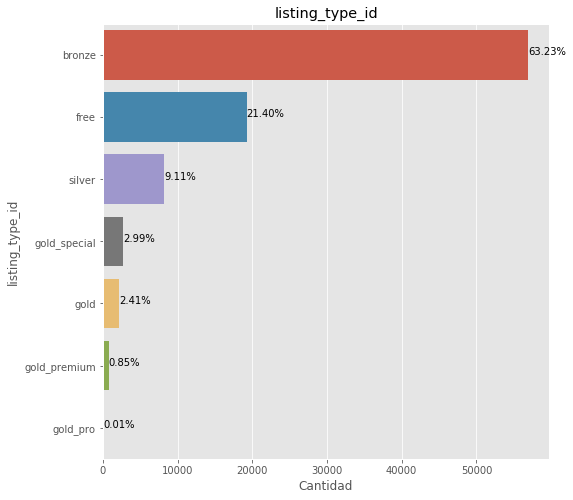

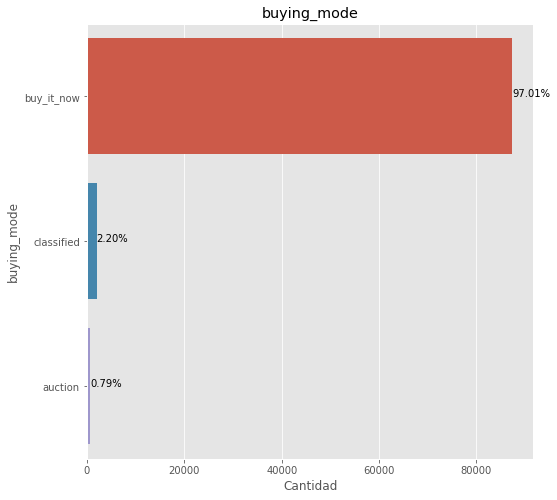

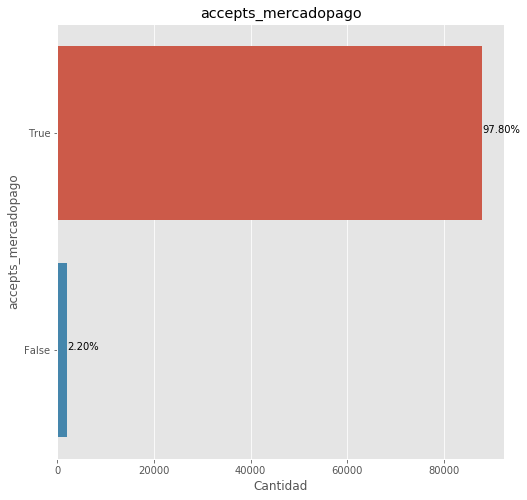

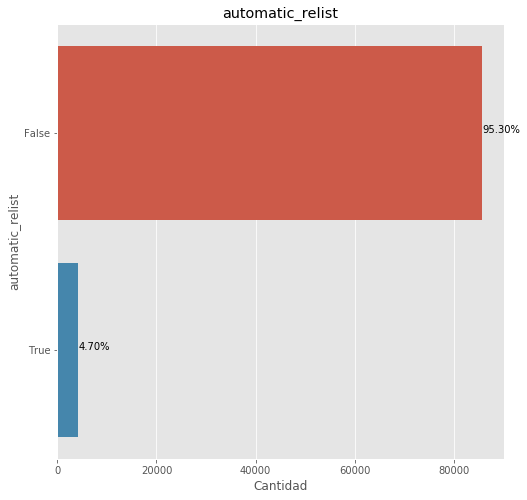

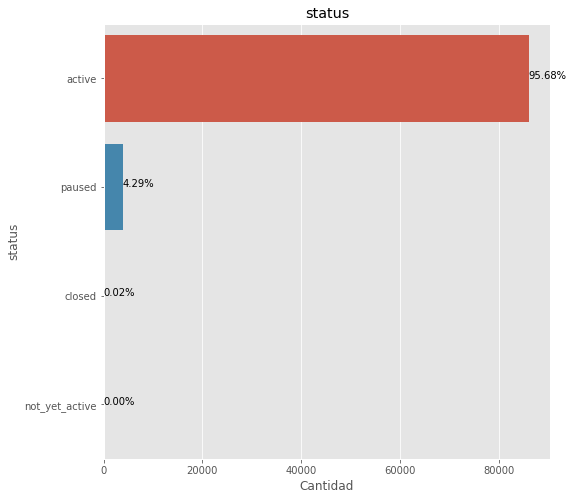

...

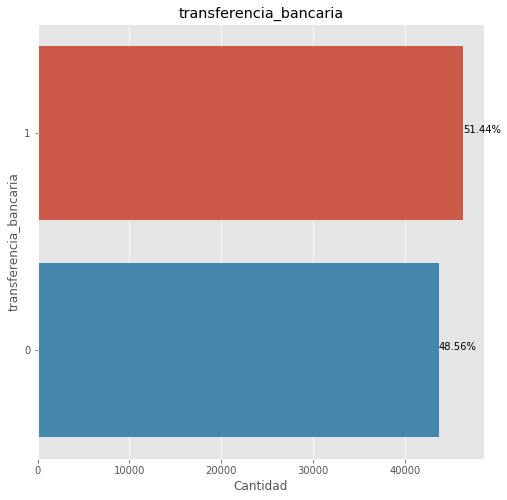

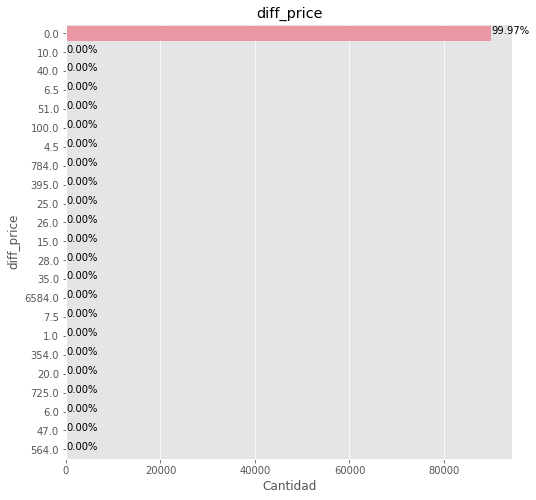

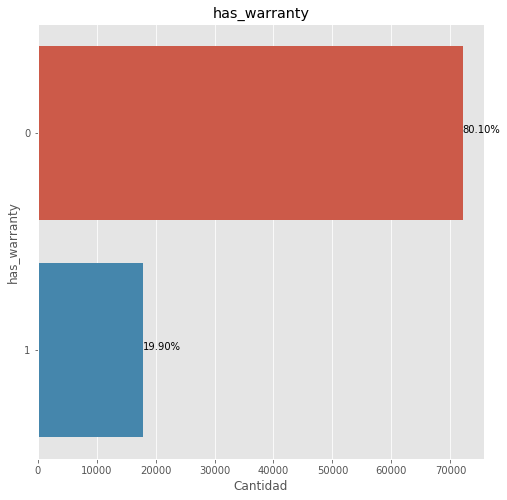

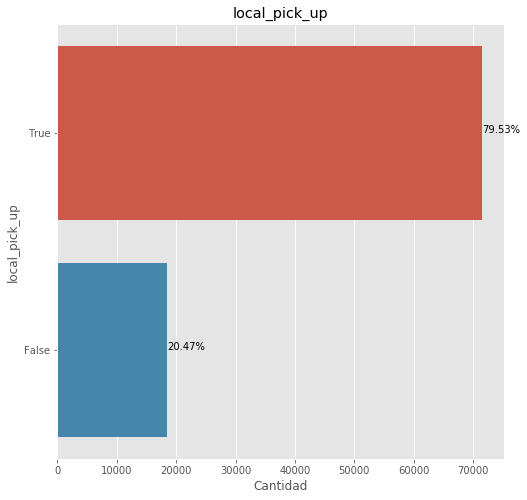

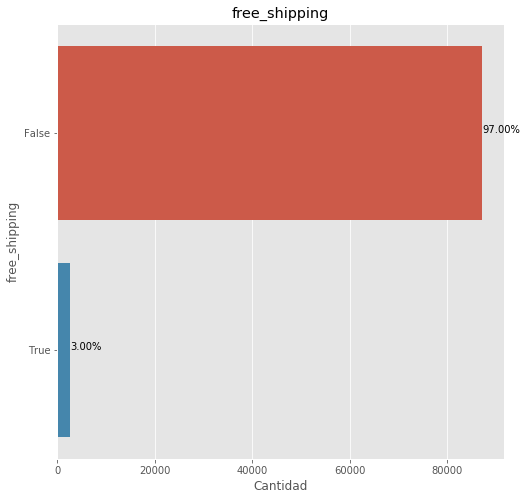

In [989]:
col_categorical_and_boolean = [ 'listing_type_id', 'buying_mode',
       'accepts_mercadopago', 'automatic_relist', 'status', 'country', 'state',
     'title_indicates_used', 'title_indicates_new',
       'efectivo', 'tarjeta_de_credito',
       'acordar_con_el_comprador', 'giro_postal', 'mercadopago', 'visa',
       'mastercard', 'contra_reembolso', 'visa_electron', 'mastercard_maestro',
       'american_express', 'diners', 'cheque_certificado',
       'transferencia_bancaria', 'diff_price', 'has_warranty',
       'local_pick_up', 'free_shipping']
for col in col_categorical_and_boolean:
    plot_freq_categorical(df[col], col, col)


In [990]:
df['transferencia_bancaria'].value_counts()

1    46300
0    43700
Name: transferencia_bancaria, dtype: int64

In [991]:
df['status'].value_counts()
# too small size for closed   and not_yet_active lets change them to the mode (active)            

active            86116
paused             3863
closed               20
not_yet_active        1
Name: status, dtype: int64

In [992]:
df['status'] = df['status'].replace({"closed": "active", "not_yet_active": "active"})

In [993]:
print(df['country'].value_counts())
# no info added in country
del df['country']

AR    89999
          1
Name: country, dtype: int64


In [994]:
print(df['state'].value_counts())
#lets keep only the top 8
map_state = {"": "Capital Federal", "Tierra del Fuego": "Capital Federal", 
            "La Rioja": "Capital Federal", "Catamarca": "Capital Federal", 
             "Santa Cruz": "Capital Federal", "Santiago del Estero": "Capital Federal", 
             "Jujuy": "Capital Federal", "San Luis": "Capital Federal", 
             "Chaco": "Capital Federal", "La Pampa": "Capital Federal", 
             "Neuquén": "Capital Federal", "Corrientes": "Capital Federal", 
            "Río Negro": "Capital Federal", "Misiones": "Capital Federal",
            "Salta": "Capital Federal", "San Juan": "Capital Federal", "Formosa": "Capital Federal"}
df['state'] = df['state'].replace(map_state)
print(df['state'].value_counts())

Capital Federal        52143
Buenos Aires           31482
Santa Fe                2398
Córdoba                 1727
Mendoza                  400
Chubut                   335
Entre Ríos               249
Tucumán                  214
San Juan                 132
Salta                    131
Misiones                 122
Río Negro                119
Corrientes               110
Neuquén                   87
La Pampa                  70
Chaco                     69
San Luis                  56
Jujuy                     33
Formosa                   28
Santiago del Estero       26
Santa Cruz                22
Catamarca                 20
La Rioja                  16
Tierra del Fuego          10
                           1
Name: state, dtype: int64
Capital Federal    53195
Buenos Aires       31482
Santa Fe            2398
Córdoba             1727
Mendoza              400
Chubut               335
Entre Ríos           249
Tucumán              214
Name: state, dtype: int64


In [995]:
state_normalized = [normalize_text(state).replace(" ", "_") for state in df['state'].value_counts().index]
state_normalized

['capital_federal',
 'buenos_aires',
 'santa_fe',
 'cordoba',
 'mendoza',
 'chubut',
 'entre_rios',
 'tucuman']

In [996]:
state_normalized = [normalize_text(state).replace(" ", "_") for state in df['state'].value_counts().index]
df['state'] = df['state'].replace(dict(zip(df['state'].value_counts().index, state_normalized)))

In [997]:
print(df['state'].value_counts())

capital_federal    53195
buenos_aires       31482
santa_fe            2398
cordoba             1727
mendoza              400
chubut               335
entre_rios           249
tucuman              214
Name: state, dtype: int64


diff_price is too sparse, lets delete it. also, diff_price was created as the difference between base_price and price. Its safe to asume they are similar so lets delete one of them

In [998]:
del df['diff_price']
del df['base_price']

lets check continuos vars

In [999]:
col_continuos = [var for var in df.columns if var not in col_categorical_and_boolean]

In [1000]:
col_continuos

['price',
 'initial_quantity',
 'sold_quantity',
 'available_quantity',
 'amount_of_pictures']

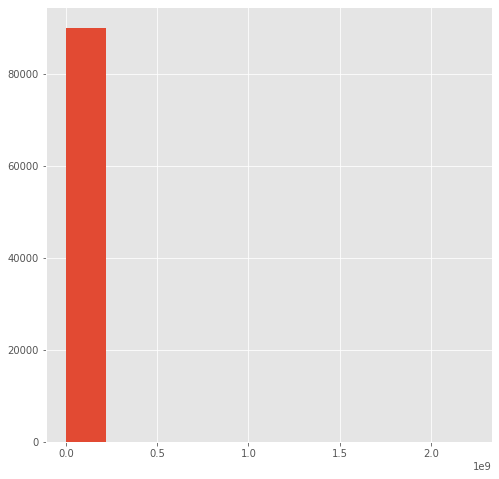

In [1001]:
for col in col_continuos:
    df[col].hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001F14659C2C8>,
      dtype=object)

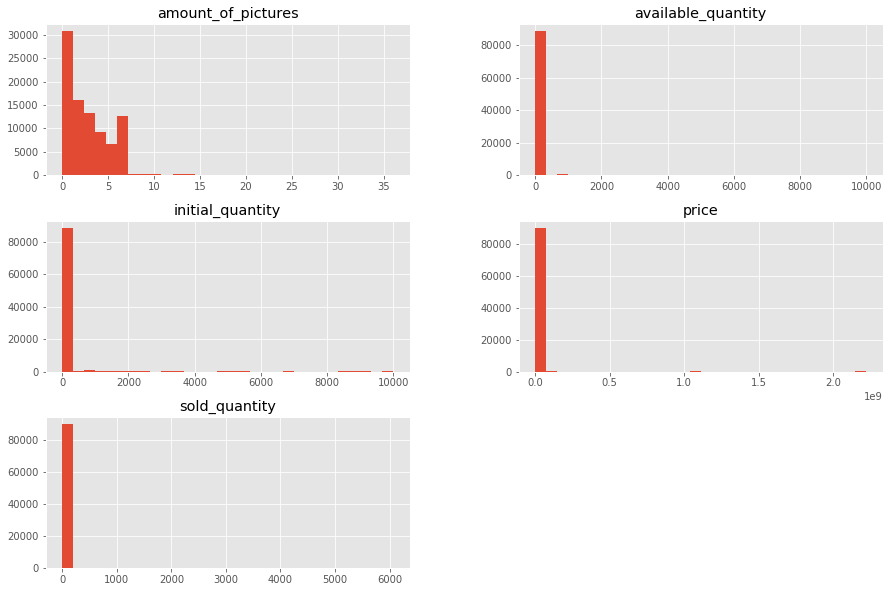

In [1002]:
df[col_continuos].hist(bins=30, figsize=(15, 10))


In [1003]:
df[col_continuos].describe(percentiles=np.arange(0.01,1.0,0.01))

,price,initial_quantity,sold_quantity,available_quantity,amount_of_pictures
count,90000.00000,90000.00000,90000.00000,90000.00000,90000.00000
mean,71606.32219,34.95718,2.32804,34.70077,2.93032
std,9109424.93757,421.09198,33.83933,420.81170,2.10423
min,0.84000,1.00000,0.00000,1.00000,0.00000
1%,17.81980,1.00000,0.00000,1.00000,1.00000
2%,24.99000,1.00000,0.00000,1.00000,1.00000
3%,29.99000,1.00000,0.00000,1.00000,1.00000
4%,30.00000,1.00000,0.00000,1.00000,1.00000
5%,35.00000,1.00000,0.00000,1.00000,1.00000
6%,39.00000,1.00000,0.00000,1.00000,1.00000


seems reasonable to take percetil 99 as the max to delete outliers

In [1004]:
def set_max(df, col, new_max):
    df[col] = df.apply(lambda x: new_max if x[col] > new_max else x[col], axis = 1)
    return df

In [1005]:
percentil_99 = df[col_continuos].describe(percentiles=np.arange(0.01,1.0,0.01)).loc["99%", :]

for col in col_continuos:
    df = set_max(df, col, percentil_99[col])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001F14A360648>,
      dtype=object)

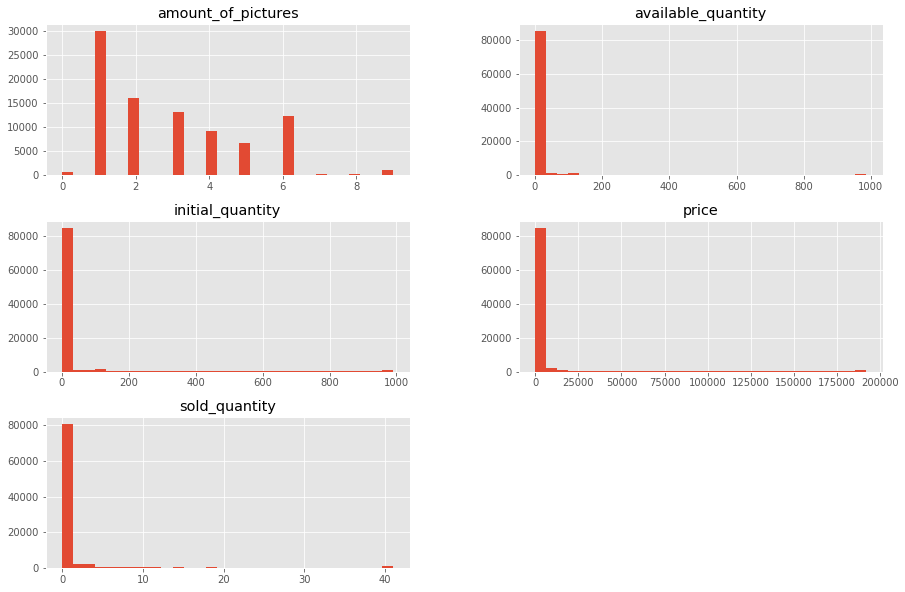

In [1006]:
df[col_continuos].hist(bins=30, figsize=(15, 10))


## lets check correlation

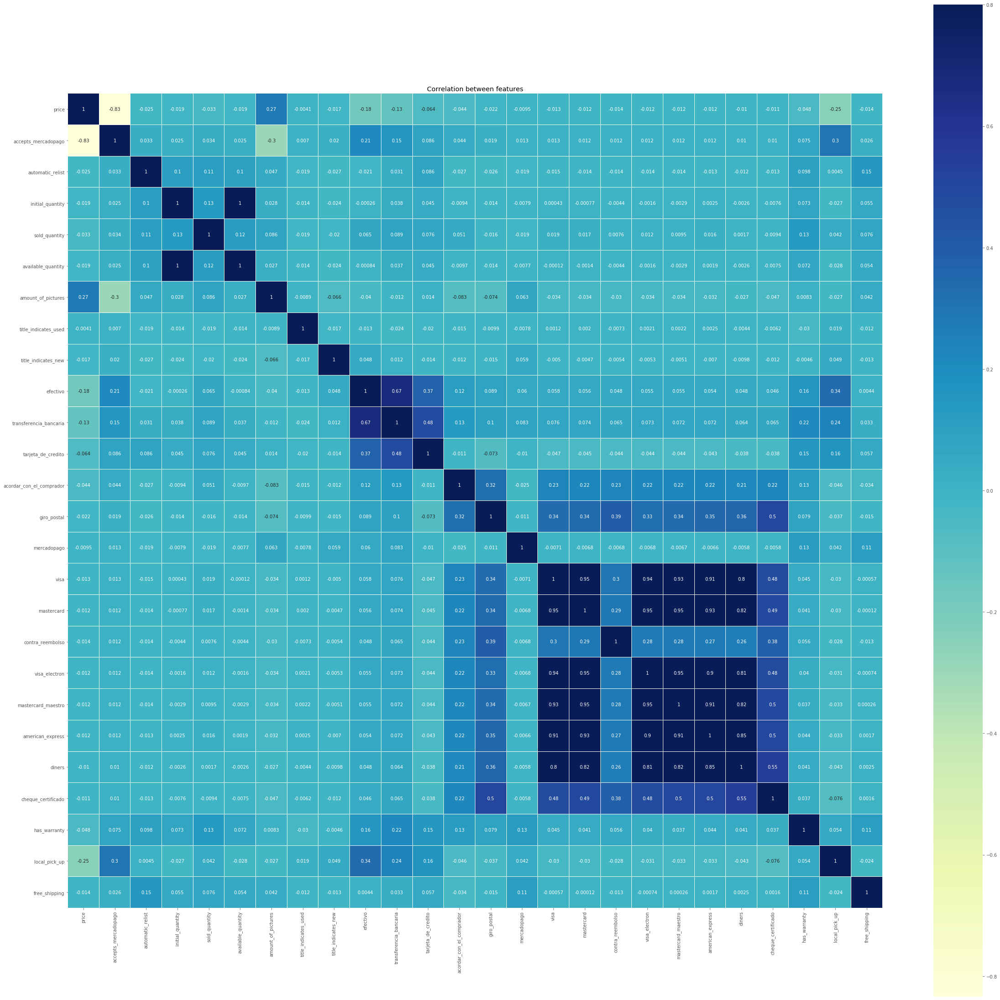

In [1007]:
corr=df.corr()
plt.figure(figsize=(40, 40))
sns.heatmap(corr, vmax=.8, linewidths=0.01,
            square=True,annot=True,cmap='YlGnBu',linecolor="white")
plt.title('Correlation between features');

In [1008]:
corr = df.corr(method ='pearson')
corr_triu = corr.where(~np.tril(np.ones(corr.shape)).astype(np.bool))
corr_triu = corr_triu.stack()
pd.DataFrame(corr_triu[(abs(corr_triu) > 0.45)])

0
price                  accepts_mercadopago    -0.83383
initial_quantity       available_quantity      0.99924
efectivo               transferencia_bancaria  0.67460
transferencia_bancaria tarjeta_de_credito      0.48385
giro_postal            cheque_certificado      0.50220
visa                   mastercard              0.95469
                       visa_electron           0.94454
                       mastercard_maestro      0.93344
                       american_express        0.91079
                       diners                  0.80401
                       cheque_certificado      0.47597
mastercard             visa_electron           0.94864
                       mastercard_maestro      0.95463
                       american_express        0.92501
                       diners                  0.82001
                       cheque_certificado      0.48961
visa_electron          mastercard_maestro      0.95244
                       american_express        0.89856
                       diners                  0.81334
                       cheque_certificado      0.47644
mastercard_maestro     american_express        0.90607
                       diners                  0.81847
                       cheque_certificado      0.49626
american_express       diners                  0.85396
                       cheque_certificado      0.50319
diners                 cheque_certificado      0.55067

initial_quantity and available_quantity are almost the same, lets delete available_quantity

In [1009]:
del df['available_quantity']

In [1011]:
y_train

['new',
 'used',
 'used',
 'new',
 'used',
 'new',
 'used',
 'used',
 'new',
 'new',
 'new',
 'new',
 'used',
 'new',
 'new',
 'new',
 'used',
 'used',
 'new',
 'new',
 'used',
 'new',
 'new',
 'used',
 'new',
 'used',
 'used',
 'used',
 'used',
 'new',
 'used',
 'new',
 'new',
 'new',
 'new',
 'used',
 'new',
 'used',
 'used',
 'used',
 'used',
 'used',
 'new',
 'new',
 'used',
 'used',
 'used',
 'new',
 'new',
 'used',
 'used',
 'new',
 'used',
 'new',
 'used',
 'new',
 'new',
 'used',
 'new',
 'new',
 'used',
 'new',
 'new',
 'used',
 'used',
 'new',
 'used',
 'used',
 'new',
 'new',
 'new',
 'new',
 'new',
 'used',
 'new',
 'used',
 'used',
 'used',
 'used',
 'new',
 'new',
 'used',
 'used',
 'used',
 'used',
 'new',
 'new',
 'used',
 'new',
 'new',
 'new',
 'used',
 'new',
 'used',
 'new',
 'new',
 'new',
 'new',
 'used',
 'used',
 'new',
 'new',
 'new',
 'used',
 'new',
 'used',
 'new',
 'new',
 'new',
 'new',
 'new',
 'new',
 'used',
 'new',
 'new',
 'new',
 'new',
 'used',
 'us

## lets check IV

In [1012]:
final_iv, IV = data_vars(df, pd.Series(y_train).map({'new': 0, 'used': 1}))
final_iv

listing_type_id
char
0
price
0


C:\Users\ax-94\anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


-0.7037593984962407
-0.7052631578947368
-0.6573787409700722
-0.7132352941176472
-0.7705882352941176
-0.7071428571428571
-0.7054945054945055
-0.7582417582417583
-0.7552447552447553
-0.7181818181818183
-0.7696969696969697
-0.7
-0.7380952380952381
-0.7857142857142859
-0.8285714285714287
-0.7
-0.7999999999999999
mono
append
buying_mode
char
append
accepts_mercadopago
char
append
automatic_relist
char
append
status
char
append
initial_quantity
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
mono
append
sold_quantity
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
mono
append
state
char
append
amount_of_pictures
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
-0.7
mono
append
title_indicates_used
char
append
title_indicates_new
char
append
efectivo
char
append
transferencia_bancaria
char
append
tarjeta_de_credito
char
append
acordar_con_el_comprador
char
append
giro_postal
char
append
mercadopago
char
append
visa
char
append
mastercard
char
append
contra_reembolso
char
append
visa_electron
char
append
mastercard_maestro
ch

,VAR_NAME,MIN_VALUE,MAX_VALUE,COUNT,EVENT,EVENT_RATE,NONEVENT,NON_EVENT_RATE,DIST_EVENT,DIST_NON_EVENT,WOE,IV
0,listing_type_id,bronze,bronze,56904,21494,0.37772,35410,0.62228,0.51609,0.73234,-0.34997,1.51747
1,listing_type_id,free,free,19260,17832,0.92586,1428,0.07414,0.42816,0.02953,2.67397,1.51747
2,listing_type_id,gold,gold,2170,301,0.13871,1869,0.86129,0.00723,0.03865,-1.67679,1.51747
3,listing_type_id,gold_premium,gold_premium,765,349,0.45621,416,0.54379,0.00838,0.00860,-0.02636,1.51747
4,listing_type_id,gold_pro,gold_pro,13,0,0.00000,13,1.00000,0.00000,0.00027,0.00000,1.51747
5,listing_type_id,gold_special,gold_special,2693,52,0.01931,2641,0.98069,0.00125,0.05462,-3.77841,1.51747
6,listing_type_id,silver,silver,8195,1620,0.19768,6575,0.80232,0.03890,0.13598,-1.25159,1.51747
7,price,0.84000,125.00000,30041,18827,0.62671,11214,0.37329,0.45205,0.23192,0.66738,0.22837
8,price,125.01000,500.00000,30492,12340,0.40470,18152,0.59530,0.29629,0.37541,-0.23668,0.22837
9,price,501.00000,192002.00000,29467,10481,0.35569,18986,0.64431,0.25166,0.39266,-0.44488,0.22837


In [1013]:
IV = pd.Series(IV.IV.values, index = IV.VAR_NAME)
IV

VAR_NAME
accepts_mercadopago        0.03783
acordar_con_el_comprador   0.01009
american_express           0.00040
amount_of_pictures         0.01703
automatic_relist           0.23712
buying_mode                0.04431
cheque_certificado         0.00981
contra_reembolso           0.00039
diners                     0.00073
efectivo                   0.01087
free_shipping              0.11498
giro_postal                0.03223
has_warranty               0.22670
initial_quantity           1.72393
listing_type_id            1.51747
local_pick_up              0.00706
mastercard                 0.00031
mastercard_maestro         0.00055
mercadopago                0.00018
price                      0.22837
sold_quantity              0.55678
state                      0.01308
status                     0.01572
tarjeta_de_credito         0.16964
title_indicates_new        0.11561
title_indicates_used       0.05671
transferencia_bancaria     0.09784
visa                       0.00022
visa_electr

In [1014]:
useless, weak, medium, strong, too_good = [], [], [], [], []
indicadores = [0.02, 0.1, 0.3, 0.5]
for i in IV.index:
    if IV[i] < indicadores[0]:
        useless.append(i)
    elif IV[i] < indicadores[1]:
        weak.append(i)
    elif IV[i] < indicadores[2]:
        medium.append(i)
    elif IV[i] < indicadores[3]:
        strong.append(i)
    else:
        too_good.append(i)
print("useless:")
print(useless)
print("\nweak predictor:")
print(weak)
print("\nmedium predictor:")
print(medium)
print("\nstrong predictor:")
print(strong)
print("\ntoo good:")
print(too_good)

useless:
['acordar_con_el_comprador', 'american_express', 'amount_of_pictures', 'cheque_certificado', 'contra_reembolso', 'diners', 'efectivo', 'local_pick_up', 'mastercard', 'mastercard_maestro', 'mercadopago', 'state', 'status', 'visa', 'visa_electron']

weak predictor:
['accepts_mercadopago', 'buying_mode', 'giro_postal', 'title_indicates_used', 'transferencia_bancaria']

medium predictor:
['automatic_relist', 'free_shipping', 'has_warranty', 'price', 'tarjeta_de_credito', 'title_indicates_new']

strong predictor:
[]

too good:
['initial_quantity', 'listing_type_id', 'sold_quantity']


lets delete variables which have low IV (useless category)

In [1015]:
for col in useless:
    del df[col]

## lets prepare the df for the model. booleans will take 0 for false 1 for true and categorical will be turned to dummies

In [1016]:
df

,listing_type_id,price,buying_mode,accepts_mercadopago,automatic_relist,initial_quantity,sold_quantity,title_indicates_used,title_indicates_new,transferencia_bancaria,tarjeta_de_credito,giro_postal,has_warranty,free_shipping
0,bronze,80.00000,buy_it_now,True,False,1.00000,0.00000,0,0,1,0,0,0,False
1,silver,2650.00000,buy_it_now,True,False,1.00000,0.00000,0,0,1,0,0,0,False
2,bronze,60.00000,buy_it_now,True,False,1.00000,0.00000,0,0,1,1,0,0,False
3,silver,580.00000,buy_it_now,True,False,1.00000,0.00000,0,0,1,1,0,0,False
4,bronze,30.00000,buy_it_now,True,False,1.00000,0.00000,0,0,1,0,0,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,bronze,68.00000,buy_it_now,True,False,1.00000,0.00000,1,0,0,0,0,0,False
89996,bronze,126.00000,buy_it_now,True,False,1.00000,1.00000,0,0,1,0,0,0,False
89997,bronze,300.00000,buy_it_now,True,False,1.00000,0.00000,0,0,0,0,0,0,False
89998,bronze,696.58000,buy_it_now,True,False,100.00000,0.00000,0,0,0,0,0,0,False


In [1017]:
df.nunique()

listing_type_id              7
price                     9328
buying_mode                  3
accepts_mercadopago          2
automatic_relist             2
initial_quantity           370
sold_quantity               42
title_indicates_used         2
title_indicates_new          2
transferencia_bancaria       2
tarjeta_de_credito           2
giro_postal                  2
has_warranty                 2
free_shipping                2
dtype: int64

In [1018]:
df.nunique().index

Index(['listing_type_id', 'price', 'buying_mode', 'accepts_mercadopago', 'automatic_relist', 'initial_quantity', 'sold_quantity', 'title_indicates_used', 'title_indicates_new', 'transferencia_bancaria', 'tarjeta_de_credito', 'giro_postal', 'has_warranty', 'free_shipping'], dtype='object')

In [1019]:
col_boolean = ['accepts_mercadopago', 
               'automatic_relist', 
               'title_indicates_used', 
               'title_indicates_new', 
               'transferencia_bancaria', 
               'tarjeta_de_credito', 
               'giro_postal', 
               'has_warranty', 
               'free_shipping']
for col in col_boolean:
    df[col] = df[col].replace({True:1, False:0})

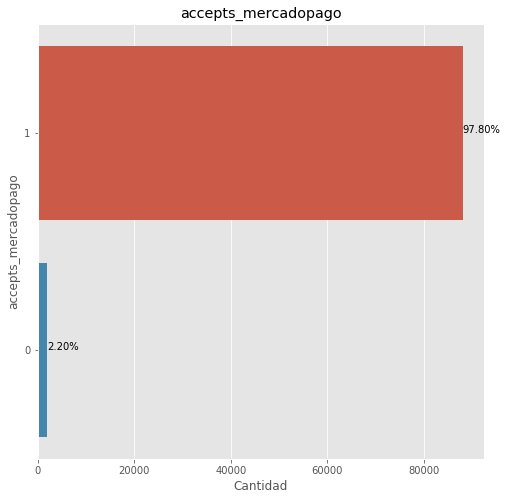

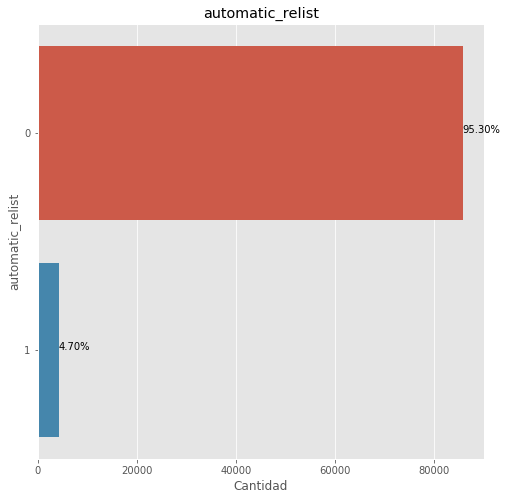

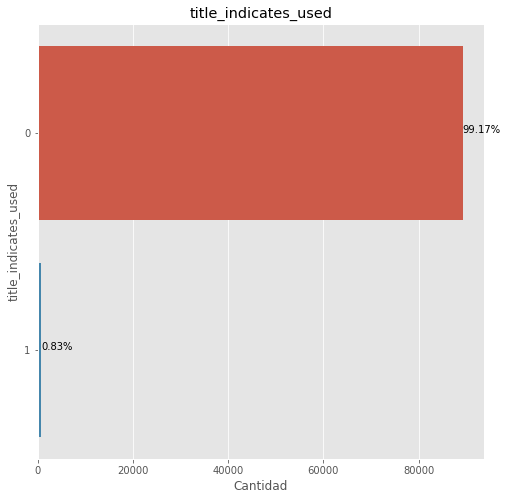

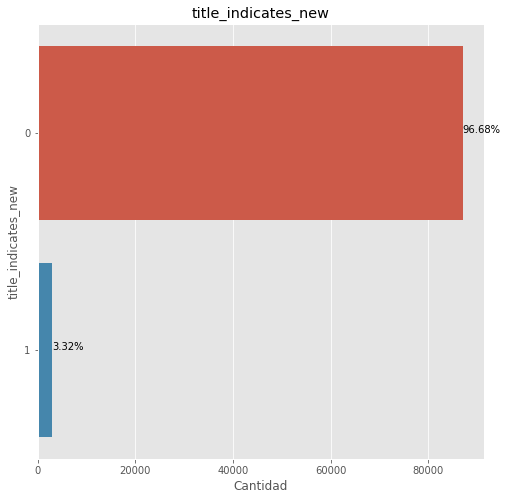

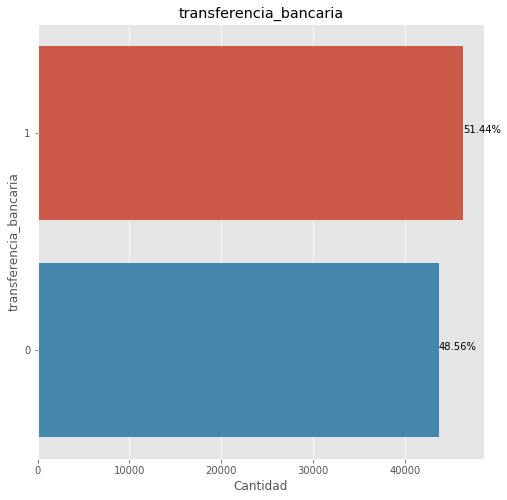

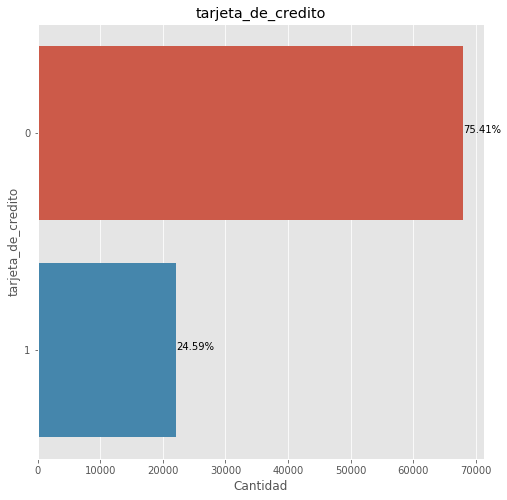

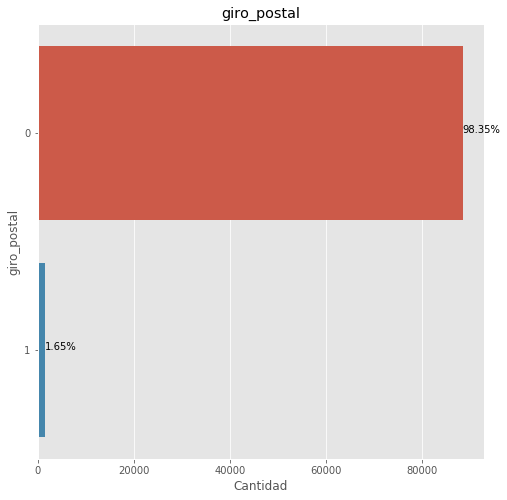

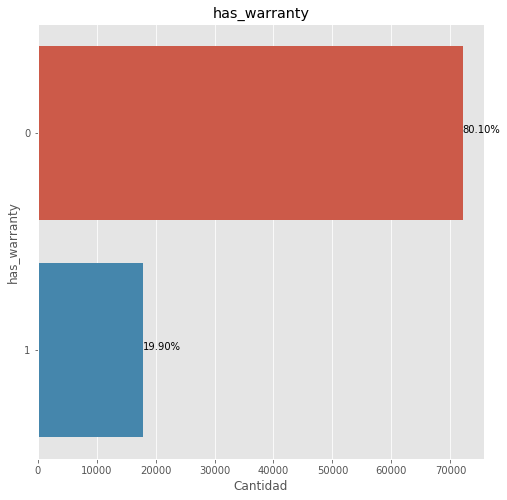

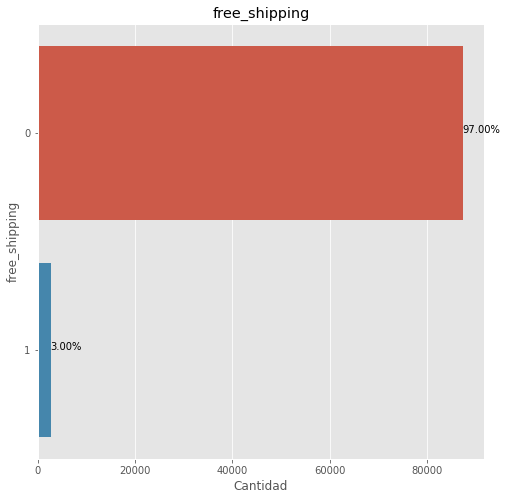

In [1020]:
for col in col_boolean:
    plot_freq_categorical(df[col], col, col)

## lets turn categorical into dummies

In [1021]:
col_categorical = ["listing_type_id", "buying_mode"]
for col_cat in col_categorical:
    one_hot_data = pd.get_dummies(df[col_cat])
    df = pd.concat([one_hot_data, df[[col for col in df.columns if col != col_cat]]], axis=1)

In [1022]:
df

,auction,buy_it_now,classified,bronze,free,gold,gold_premium,gold_pro,gold_special,silver,price,accepts_mercadopago,automatic_relist,initial_quantity,sold_quantity,title_indicates_used,title_indicates_new,transferencia_bancaria,tarjeta_de_credito,giro_postal,has_warranty,free_shipping
0,0,1,0,1,0,0,0,0,0,0,80.00000,1,0,1.00000,0.00000,0,0,1,0,0,0,0
1,0,1,0,0,0,0,0,0,0,1,2650.00000,1,0,1.00000,0.00000,0,0,1,0,0,0,0
2,0,1,0,1,0,0,0,0,0,0,60.00000,1,0,1.00000,0.00000,0,0,1,1,0,0,0
3,0,1,0,0,0,0,0,0,0,1,580.00000,1,0,1.00000,0.00000,0,0,1,1,0,0,0
4,0,1,0,1,0,0,0,0,0,0,30.00000,1,0,1.00000,0.00000,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,0,1,0,1,0,0,0,0,0,0,68.00000,1,0,1.00000,0.00000,1,0,0,0,0,0,0
89996,0,1,0,1,0,0,0,0,0,0,126.00000,1,0,1.00000,1.00000,0,0,1,0,0,0,0
89997,0,1,0,1,0,0,0,0,0,0,300.00000,1,0,1.00000,0.00000,0,0,0,0,0,0,0
89998,0,1,0,1,0,0,0,0,0,0,696.58000,1,0,100.00000,0.00000,0,0,0,0,0,0,0


to avoid colineality, lets drop one column (category) of both categorical variables

In [1023]:
del df['classified']
del df['bronze']

In [1024]:
X_train = df.copy()

## lets prepare the target for the model

In [1025]:
y_train = pd.Series(y_train).map({'new': 0, 'used': 1})

In [1026]:
y_train.value_counts()

0    48352
1    41648
dtype: int64

its a balanced problem, we could use accuracy as a metric, but ROC can be always used

## standarize sample

In [1027]:
scaler = MinMaxScaler()
X_train_std = scaler.fit_transform(X_train)

In [1028]:
X_train_std

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.]])

## simple regression model

lets start with use sm because it gives info like P(0) which sklearn does not have

In [751]:
logit_model = sm.Logit(y_train,X_train_std)
result = logit_model.fit(maxiter = 10000)
print(result.summary2())
result.summary2().tables[1].set_index(df.columns)

         Current function value: 0.450096
         Iterations: 10000


C:\Users\ax-94\anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\ax-94\anaconda3\lib\site-packages\statsmodels\base\model.py:1354: RuntimeWarning: invalid value encountered in sqrt
  bse_ = np.sqrt(np.diag(self.cov_params()))
C:\Users\ax-94\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\Users\ax-94\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\Users\ax-94\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.348     
Dependent Variable: y                AIC:              81055.2115
Date:               2021-01-27 15:28 BIC:              81233.9552
No. Observations:   90000            Log-Likelihood:   -40509.   
Df Model:           18               LL-Null:          -62133.   
Df Residuals:       89981            LLR p-value:      0.0000    
Converged:          0.0000           Scale:            1.0000    
No. Iterations:     10000.0000                                   
-----------------------------------------------------------------
         Coef.    Std.Err.    z     P>|z|     [0.025     0.975]  
-----------------------------------------------------------------
x1        0.3088       nan      nan    nan         nan        nan
x2       -0.1248       nan      nan    nan         nan        nan
x3        2.7481    0.0307  89.5989 0.0000      2.6880     2.8083
x4       -0.5786    0.0831  -6.9589 

,Coef.,Std.Err.,z,P>|z|,[0.025,0.975]
auction,0.30882,nan,nan,nan,nan,nan
buy_it_now,-0.12476,nan,nan,nan,nan,nan
free,2.74814,0.03067,89.59887,0.00000,2.68802,2.80825
gold,-0.57859,0.08314,-6.95890,0.00000,-0.74155,-0.41563
gold_premium,0.88767,0.12056,7.36266,0.00000,0.65137,1.12397
gold_pro,-17.62067,5490.78237,-0.00321,0.99744,-10779.35636,10744.11501
gold_special,-2.08956,0.16873,-12.38398,0.00000,-2.42027,-1.75885
silver,-0.77538,0.03789,-20.46577,0.00000,-0.84963,-0.70112
price,1.62007,0.07853,20.62867,0.00000,1.46615,1.77400
accepts_mercadopago,0.18407,nan,nan,nan,nan,nan


In [755]:
X_train_std_lr = X_train_std
y_train_lr = y_train
grid={"C":np.logspace(-3,3,7)}
logreg=LogisticRegression(solver='sag', max_iter=2000)#solver='sag' because https://stackoverflow.com/questions/38640109/logistic-regression-python-solvers-defintions/52388406#52388406
logreg_cv=GridSearchCV(logreg, grid,cv=10, scoring='roc_auc')
logreg_cv.fit(X_train_std_lr,y_train_lr)
scores_train = cross_val_score(logreg_cv, X_train_std_lr, y_train_lr, scoring='roc_auc', cv=5, n_jobs=-1)
print('Mean train ROC AUC: %.3f' % mean(scores_train))

lr_modelo_final = logreg_cv
filename = 'lr_model.sav'
pickle.dump(lr_modelo_final, open(filename, 'wb'))

Mean train ROC AUC: 0.883


In [757]:
logreg_cv.get_params

<bound method BaseEstimator.get_params of GridSearchCV(cv=10, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=2000, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='sag',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=0)>

In [767]:
dict(zip(df.columns.values, np.transpose(logreg_cv.best_estimator_.coef_)))

{'auction': array([-0.44510361]),
 'buy_it_now': array([-0.87271469]),
 'free': array([2.73536225]),
 'gold': array([-0.89546366]),
 'gold_premium': array([0.08028315]),
 'gold_pro': array([-4.42131633]),
 'gold_special': array([-2.26790767]),
 'silver': array([-1.00588656]),
 'price': array([-0.51842781]),
 'accepts_mercadopago': array([-1.3178183]),
 'automatic_relist': array([-0.51740999]),
 'initial_quantity': array([-42.26350463]),
 'sold_quantity': array([-25.44453705]),
 'title_indicates_used': array([2.89906467]),
 'title_indicates_new': array([-2.6952804]),
 'transferencia_bancaria': array([0.0755064]),
 'tarjeta_de_credito': array([-0.59426852]),
 'giro_postal': array([1.92001542]),
 'warranty_processed': array([-0.68304232]),
 'free_shipping': array([-1.91966172])}

In [756]:
scores_train = cross_val_score(logreg_cv, X_train_std_lr, y_train_lr, scoring="accuracy", cv=5, n_jobs=-1)
print('Mean train accuracy: %.3f' % mean(scores_train))


Mean train accuracy: 0.790


# Lets test the model with the test data

In [787]:
for elem in X_test:
    add_country_state_and_city_and_delete_dict_location(elem)
    add_amount_of_pictures_and_del_pictures(elem)
    search_keywords_on_title_and_del_title(elem)
    del elem['sub_status']
    elem['efectivo'] = 0
    elem['transferencia_bancaria'] = 0
    elem['tarjeta_de_credito'] = 0
    elem['acordar_con_el_comprador'] = 0
    elem['giro_postal'] = 0
    elem['mercadopago'] = 0
    elem['visa'] = 0
    elem['mastercard'] = 0
    elem['contra_reembolso'] = 0
    elem['visa_electron'] = 0
    elem['mastercard_maestro'] = 0
    elem['american_express'] = 0
    elem['diners'] = 0
    elem['cheque_certificado'] = 0
    for non_mercado_pago_payment_method in elem['non_mercado_pago_payment_methods']:
        type_of_payment = non_mercado_pago_payment_method['description'].lower().replace(" ", "_").replace("é", "e")
        elem[type_of_payment] = 1
    del elem['non_mercado_pago_payment_methods']
    if elem['currency_id'] == 'USD':
        elem['price'] = elem['price'] * dollar_exchange_rate_2015_09
        elem['base_price'] = elem['base_price'] * dollar_exchange_rate_2015_09
    del elem['currency_id']
    del elem['original_price']
    elem['diff_price'] = elem['price'] - elem['base_price']
    if elem['warranty']:
        if "garantia oficial" in elem['warranty'] or "fabrica" in elem['warranty'] or elem['warranty'] == "si" or "mes" in elem['warranty'] or "dia" in elem['warranty'] or "anio" in elem['warranty'] or "con garantia" in elem['warranty']:
            elem['has_warranty'] = 1
        else:
            elem['has_warranty'] = 0
    else:
        elem['has_warranty'] = 0
    del elem['warranty']
    delete_vars = ['deal_ids',
             'seller_id',
             'site_id',
             'parent_item_id',
             'category_id',
             'id',
             'official_store_id',
             'video_id',
             'catalog_product_id',
              'descriptions',
              'last_updated',
              'date_created',
              'stop_time',
              'start_time',
              'geolocation',
              'permalink',
              'secure_thumbnail',
              'thumbnail',
              'location',
              'seller_contact',
              'international_delivery_mode',
              'listing_source',
              'coverage_areas',
              'attributes',
              'variations',
              'tags']

    for var in delete_vars:
        del elem[var]
        
    elem['local_pick_up'] = elem["shipping"]["local_pick_up"]
    elem['free_shipping'] = elem["shipping"]["free_shipping"]
    elem['shipping_mode'] = elem["shipping"]["mode"]
    elem['dimensions'] = elem["shipping"]["dimensions"]
    del elem['dimensions']
    if elem['shipping_mode'] == 'not_specified':
        elem['shipping_mode'] = 'me2' #set mode for missing
    elem['local_pick_up'] = elem["shipping"]["local_pick_up"]
    elem['free_shipping'] = elem["shipping"]["free_shipping"]
    del elem["shipping"]

list_of_rows = []
for elem in X_test:
    list_of_rows.append(list(elem.values()))

df_test = pd.DataFrame(list_of_rows, columns=list(X_test[0].keys()))
df_test

,base_price,listing_type_id,price,buying_mode,differential_pricing,accepts_mercadopago,automatic_relist,status,subtitle,initial_quantity,sold_quantity,available_quantity,country,state,city,amount_of_pictures,title_indicates_used,title_indicates_new,efectivo,transferencia_bancaria,tarjeta_de_credito,acordar_con_el_comprador,giro_postal,mercadopago,visa,mastercard,contra_reembolso,visa_electron,mastercard_maestro,american_express,diners,cheque_certificado,diff_price,has_warranty,local_pick_up,free_shipping,shipping_mode
0,6700.00000,silver,6700.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Buenos Aires,General Rodríguez,6,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,custom
1,119.00000,bronze,119.00000,buy_it_now,None,True,False,active,None,19,0,19,AR,Capital Federal,MICROCENTRO,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,False,False,me2
2,450.00000,bronze,450.00000,buy_it_now,None,True,False,active,None,2,0,2,AR,Buenos Aires,Morón,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,False,False,me2
3,40.00000,bronze,40.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Buenos Aires,acassuso,2,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2
4,30.00000,bronze,30.00000,buy_it_now,None,True,False,active,None,1,1,1,AR,Capital Federal,Palermo,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,30.00000,free,30.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Buenos Aires,Don Torcuato,6,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2
9996,239.00000,bronze,239.00000,buy_it_now,None,True,False,active,None,5,0,5,AR,Buenos Aires,Lomas de Zamora,3,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,False,False,me2
9997,600.00000,bronze,600.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Buenos Aires,Morón,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,False,False,me2
9998,50.00000,bronze,50.00000,buy_it_now,None,True,False,active,None,1,0,1,AR,Capital Federal,Balvanera,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0.00000,0,True,False,me2


In [788]:
df_test_copy = df_test.copy()

In [798]:
df_test = df_test_copy.copy()

In [799]:

del df_test['subtitle']
del df_test['differential_pricing']
del df_test['shipping_mode']#check_later
del df_test['city']
df_test['status'] = df_test['status'].replace({"closed": "active", "not_yet_active": "active"})
del df_test['country']
"""
map_state = {"": "Capital Federal", "Tierra del Fuego": "Capital Federal", 
            "La Rioja": "Capital Federal", "Catamarca": "Capital Federal", 
             "Santa Cruz": "Capital Federal", "Santiago del Estero": "Capital Federal", 
             "Jujuy": "Capital Federal", "San Luis": "Capital Federal", 
             "Chaco": "Capital Federal", "La Pampa": "Capital Federal", 
             "Neuquén": "Capital Federal", "Corrientes": "Capital Federal", 
            "Río Negro": "Capital Federal", "Misiones": "Capital Federal",
            "Salta": "Capital Federal", "San Juan": "Capital Federal", "Formosa": "Capital Federal"}
df_test['state'] = df_test['state'].replace(map_state)
state_normalized = [normalize_text(state).replace(" ", "_") for state in df_test['state'].value_counts().index]
df_test['state'] = df_test['state'].replace(dict(zip(df_test['state'].value_counts().index, state_normalized)))
# state will not be used
"""
del df_test['diff_price']
del df_test['base_price']
for col in col_continuos:
    df_test = set_max(df_test, col, percentil_99[col]) # the ones from train
del df_test['available_quantity']
for col in useless: # the ones from train
    del df_test[col]
col_boolean = ['accepts_mercadopago', 
               'automatic_relist', 
               'title_indicates_used', 
               'title_indicates_new', 
               'transferencia_bancaria', 
               'tarjeta_de_credito', 
               'giro_postal', 
               'has_warranty', 
               'free_shipping']
for col in col_boolean:
    df_test[col] = df_test[col].replace({True:1, False:0})
col_categorical = ["listing_type_id", "buying_mode"]
for col_cat in col_categorical:
    one_hot_data = pd.get_dummies(df_test[col_cat])
    df_test = pd.concat([one_hot_data, df_test[[col for col in df_test.columns if col != col_cat]]], axis=1)
del df_test['classified']
del df_test['bronze']
y_test = pd.Series(y_test).map({'new': 0, 'used': 1})
X_test = df_test.copy()
X_test_std = scaler.transform(X_test) # the scaler from train

Mean train accuracy: 0.805


In [803]:
scores_test = cross_val_score(logreg_cv, X_test_std, y_test, scoring="roc_auc", cv=5, n_jobs=-1)
print('Mean test roc_auc: %.3f' % mean(scores_test))

Mean test roc_auc: 0.899


In [800]:
scores_test = cross_val_score(logreg_cv, X_test_std, y_test, scoring="accuracy", cv=5, n_jobs=-1)
print('Mean test accuracy: %.3f' % mean(scores_test))

Mean test accuracy: 0.805


### test has similar accuracy to train and is a good one for a first iteration